# Team assignment - Boston 2016

___

# 1 Data Collection and Preparation

___

In [1]:
import numpy as np
from numpy import mean
from numpy import std
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns
import datetime

### Bike Rentals

Read data on bike rentals:

In [2]:
bike = pd.read_csv("boston_2016.csv")

In [3]:
#for later use
#bike15 = pd.read_csv("boston_2015.csv")
#bike17 = pd.read_csv("boston_2017.csv")
#bike18 = pd.read_csv("boston_2018.csv")
#bike19 = pd.read_csv("boston_2019.csv")

In [4]:
bike.head(5)

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber
3,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber
4,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer


In [5]:
bike.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1236203 entries, 0 to 1236202
Data columns (total 8 columns):
 #   Column              Non-Null Count    Dtype 
---  ------              --------------    ----- 
 0   start_time          1236203 non-null  object
 1   end_time            1236203 non-null  object
 2   start_station_id    1236203 non-null  int64 
 3   end_station_id      1236203 non-null  int64 
 4   start_station_name  1236203 non-null  object
 5   end_station_name    1236203 non-null  object
 6   bike_id             1236203 non-null  int64 
 7   user_type           1236203 non-null  object
dtypes: int64(3), object(5)
memory usage: 75.5+ MB


Number of entries (1236203) = Non-Null count for all colums, meaning we are not missing any values.

**Cleaning the Dataset:**

The bike dataset does not contain any missing values.

In [6]:
bike.isnull()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type
0,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...
1236198,False,False,False,False,False,False,False,False
1236199,False,False,False,False,False,False,False,False
1236200,False,False,False,False,False,False,False,False
1236201,False,False,False,False,False,False,False,False


In [7]:
# Transforming Dtype of start_time/end_time from object to datetime
bike['start_time'] = pd.to_datetime(bike['start_time'])
bike['end_time'] = pd.to_datetime(bike['end_time'])
bike.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1236203 entries, 0 to 1236202
Data columns (total 8 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   start_time          1236203 non-null  datetime64[ns]
 1   end_time            1236203 non-null  datetime64[ns]
 2   start_station_id    1236203 non-null  int64         
 3   end_station_id      1236203 non-null  int64         
 4   start_station_name  1236203 non-null  object        
 5   end_station_name    1236203 non-null  object        
 6   bike_id             1236203 non-null  int64         
 7   user_type           1236203 non-null  object        
dtypes: datetime64[ns](2), int64(3), object(3)
memory usage: 75.5+ MB


In [8]:
# Creates column that provides the duration of the rental period
bike['trip_duration'] = bike['end_time']-bike['start_time']
bike.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_duration
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber,0 days 00:32:19
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber,0 days 00:32:08
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber,0 days 00:30:14
3,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber,0 days 00:29:49
4,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer,0 days 00:15:41


In [9]:
# Creates coulumn that provides the day of the week ranging from 0 (Monday) to 6 (Sunday)
bike["weekday"] = bike["start_time"].dt.dayofweek
bike.head(60000)

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_duration,weekday
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber,0 days 00:32:19,4
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber,0 days 00:32:08,4
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber,0 days 00:30:14,4
3,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber,0 days 00:29:49,4
4,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer,0 days 00:15:41,4
...,...,...,...,...,...,...,...,...,...,...
59995,2016-03-28 16:30:21,2016-03-28 16:32:40,91,80,One Kendall Square at Hampshire St / Portland St,MIT Stata Center at Vassar St / Main St,769,Customer,0 days 00:02:19,0
59996,2016-03-28 16:31:49,2016-03-28 16:36:49,108,115,Harvard University / SEAS Cruft-Pierce Halls a...,Porter Square Station,1109,Subscriber,0 days 00:05:00,0
59997,2016-03-28 16:32:14,2016-03-28 16:40:06,189,88,Kendall T,Inman Square at Vellucci Plaza / Hampshire St,1051,Subscriber,0 days 00:07:52,0
59998,2016-03-28 16:32:28,2016-03-28 16:42:43,22,38,South Station - 700 Atlantic Ave.,TD Garden - Causeway at Portal Park #2,1081,Subscriber,0 days 00:10:15,0


**Elimination**

In [10]:
# Dropping entries with negative trip duration
bike = bike[bike['trip_duration'] >= pd.Timedelta(0)]
bike.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1236200 entries, 0 to 1236202
Data columns (total 10 columns):
 #   Column              Non-Null Count    Dtype          
---  ------              --------------    -----          
 0   start_time          1236200 non-null  datetime64[ns] 
 1   end_time            1236200 non-null  datetime64[ns] 
 2   start_station_id    1236200 non-null  int64          
 3   end_station_id      1236200 non-null  int64          
 4   start_station_name  1236200 non-null  object         
 5   end_station_name    1236200 non-null  object         
 6   bike_id             1236200 non-null  int64          
 7   user_type           1236200 non-null  object         
 8   trip_duration       1236200 non-null  timedelta64[ns]
 9   weekday             1236200 non-null  int64          
dtypes: datetime64[ns](2), int64(4), object(3), timedelta64[ns](1)
memory usage: 103.7+ MB


In [11]:
# Dropping entries for which trip_duration is more than a day
one_day = datetime.timedelta(days=1)

bike = bike[bike['trip_duration'] <= one_day]
bike.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1235121 entries, 0 to 1236202
Data columns (total 10 columns):
 #   Column              Non-Null Count    Dtype          
---  ------              --------------    -----          
 0   start_time          1235121 non-null  datetime64[ns] 
 1   end_time            1235121 non-null  datetime64[ns] 
 2   start_station_id    1235121 non-null  int64          
 3   end_station_id      1235121 non-null  int64          
 4   start_station_name  1235121 non-null  object         
 5   end_station_name    1235121 non-null  object         
 6   bike_id             1235121 non-null  int64          
 7   user_type           1235121 non-null  object         
 8   trip_duration       1235121 non-null  timedelta64[ns]
 9   weekday             1235121 non-null  int64          
dtypes: datetime64[ns](2), int64(4), object(3), timedelta64[ns](1)
memory usage: 103.7+ MB


In [12]:
bike.to_csv('Pred_Model.csv')

___

### Weather

Read weather data:

In [13]:
weatherhour = pd.read_csv("weather_hourly_boston.csv")

In [14]:
weatherhour.head(3)

,date_time,max_temp,min_temp,precip
0,2015-01-02 01:00:00,-1.1,-1.1,0.0
1,2015-01-02 02:00:00,-1.1,-1.1,0.0
2,2015-01-02 03:00:00,-0.6,-0.6,0.0


In [15]:
weatherhour.describe()

,max_temp,min_temp,precip
count,43354.000000,43354.000000,43356.000000
mean,11.456717,11.395922,0.095581
std,10.118606,10.114095,0.294019
min,-22.800000,-22.800000,0.000000
25%,3.300000,3.300000,0.000000
50%,11.700000,11.700000,0.000000
75%,20.000000,19.850000,0.000000
max,36.100000,36.100000,1.000000


In [16]:
weatherhour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43848 entries, 0 to 43847
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   date_time  43354 non-null  object 
 1   max_temp   43354 non-null  float64
 2   min_temp   43354 non-null  float64
 3   precip     43356 non-null  float64
dtypes: float64(3), object(1)
memory usage: 1.3+ MB


Number of entries (43848) != Non-Null count for all colums, meaning we are (!) missing values.

In [17]:
#transforming Dtype of date_time from object to datetime
weatherhour['date_time'] = pd.to_datetime(weatherhour['date_time'])
weatherhour.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43848 entries, 0 to 43847
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date_time  43354 non-null  datetime64[ns]
 1   max_temp   43354 non-null  float64       
 2   min_temp   43354 non-null  float64       
 3   precip     43356 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 1.3 MB


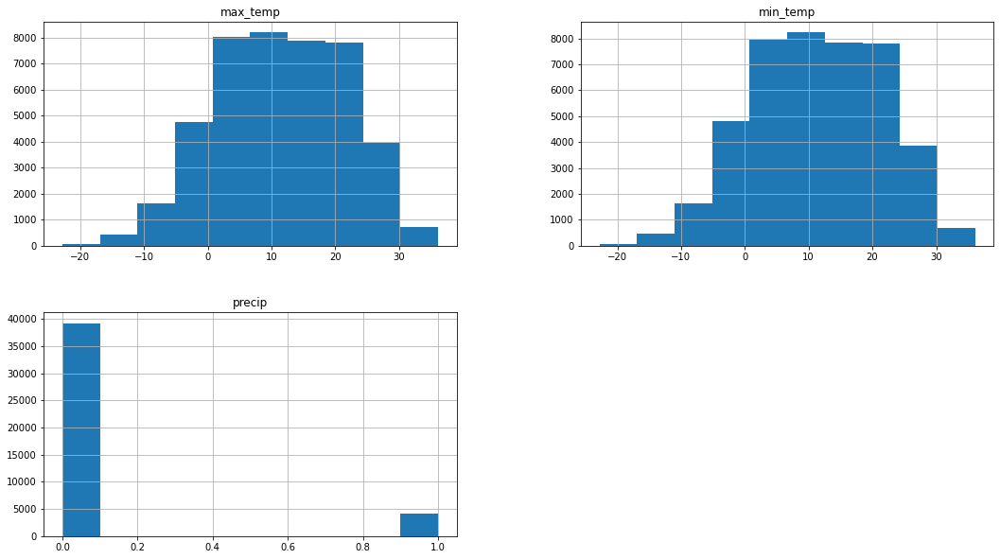

In [18]:
# Histogram of all numeric fields
weatherhour_hist = weatherhour.drop(columns=['date_time'],axis=1)
weatherhour_hist.hist(figsize=(18,10));

**Cleaning the Dataset:**

In [19]:
weatherhour.isnull()

,date_time,max_temp,min_temp,precip
0,False,False,False,False
1,False,False,False,False
2,False,False,False,False
3,False,False,False,False
4,False,False,False,False
...,...,...,...,...
43843,False,False,False,False
43844,False,False,False,False
43845,False,False,False,False
43846,False,False,False,False


Mostly, for given entries values are missing for all attributes.

In [20]:
# Display entries with NaN values
NaN_for_attribute = weatherhour[weatherhour["date_time"].isna()] #insert any attribute
NaN_for_attribute

,date_time,max_temp,min_temp,precip
98,NaT,NaN,NaN,NaN
145,NaT,NaN,NaN,NaN
304,NaT,NaN,NaN,NaN
395,NaT,NaN,NaN,NaN
588,NaT,NaN,NaN,NaN
...,...,...,...,...
43019,NaT,NaN,NaN,NaN
43428,NaT,NaN,NaN,NaN
43570,NaT,NaN,NaN,NaN
43594,NaT,NaN,NaN,NaN


**Elimination**

In [21]:
# Dropping rows with missing values
weatherhour.dropna(axis=0, inplace=True)
NaN_for_attribute = weatherhour[weatherhour["date_time"].isna()] #insert any attribute
NaN_for_attribute

,date_time,max_temp,min_temp,precip


In [22]:
weatherhour.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43354 entries, 0 to 43847
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date_time  43354 non-null  datetime64[ns]
 1   max_temp   43354 non-null  float64       
 2   min_temp   43354 non-null  float64       
 3   precip     43354 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 1.7 MB


In [23]:
# Dropping duplicates (date_time)
# Only date_time is faulty, dropping duplicates leads to less data! 
# We should fix this by just manipulating the entries in the date_time column.
weatherhour.drop_duplicates(subset='date_time', keep='first', inplace=True, ignore_index=False)
weatherhour.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40889 entries, 0 to 43847
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date_time  40889 non-null  datetime64[ns]
 1   max_temp   40889 non-null  float64       
 2   min_temp   40889 non-null  float64       
 3   precip     40889 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 1.6 MB


**Imputation** <br>
To maintain the completeness of the time series dataset, we have decided to impute missing values.

In [24]:
# Extending the dataframe with missing time stamps
# Set the index to the datetime column
weatherhour.index = pd.to_datetime(weatherhour['date_time'])

# Generate a sequence of hourly dates between the start and end dates of the data
dates = pd.date_range(start=weatherhour.index.min(), end=weatherhour.index.max(), freq='H')

# Reindex the dataframe with the new dates
weatherhour = weatherhour.reindex(dates)

weatherhour.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 43848 entries, 2015-01-01 06:00:00 to 2020-01-02 05:00:00
Freq: H
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   date_time  40889 non-null  datetime64[ns]
 1   max_temp   40889 non-null  float64       
 2   min_temp   40889 non-null  float64       
 3   precip     40889 non-null  float64       
dtypes: datetime64[ns](1), float64(3)
memory usage: 1.7 MB


In [25]:
weatherhour.head()

,date_time,max_temp,min_temp,precip
2015-01-01 06:00:00,2015-01-01 06:00:00,-5.6,-5.6,0.0
2015-01-01 07:00:00,2015-01-01 07:00:00,-5.6,-5.6,0.0
2015-01-01 08:00:00,2015-01-01 08:00:00,-5.6,-5.6,0.0
2015-01-01 09:00:00,2015-01-01 09:00:00,-4.4,-4.4,0.0
2015-01-01 10:00:00,2015-01-01 10:00:00,-5.6,-5.6,0.0


In [26]:
# Deletes date_time column as it is now our index
weatherhour.drop('date_time', axis=1, inplace=True)

In [27]:
weatherhour.head()

,max_temp,min_temp,precip
2015-01-01 06:00:00,-5.6,-5.6,0.0
2015-01-01 07:00:00,-5.6,-5.6,0.0
2015-01-01 08:00:00,-5.6,-5.6,0.0
2015-01-01 09:00:00,-4.4,-4.4,0.0
2015-01-01 10:00:00,-5.6,-5.6,0.0


In [28]:
# Imputing missing values by means of interpolation
weatherhour['interp_maxtemp']  = weatherhour['max_temp'].interpolate()   # mean of prev/next
weatherhour['interp_mintemp']  = weatherhour['min_temp'].interpolate()   # mean of prev/next
weatherhour['interp_precip']  = weatherhour['precip'].interpolate()   # mean of prev/next
weatherhour['update_maxtemp'] = weatherhour['interp_maxtemp']
weatherhour['update_maxtemp'].update( weatherhour['max_temp'] )  # note: this is an inplace operation
weatherhour['update_mintemp'] = weatherhour['interp_mintemp']
weatherhour['update_mintemp'].update( weatherhour['min_temp'] )  # note: this is an inplace operation
weatherhour['update_precip'] = weatherhour['interp_precip']
weatherhour['update_precip'].update( weatherhour['precip'] )  # note: this is an inplace operation
weatherhour.head(98)

,max_temp,min_temp,precip,interp_maxtemp,interp_mintemp,interp_precip,update_maxtemp,update_mintemp,update_precip
2015-01-01 06:00:00,-5.6,-5.6,0.0,-5.60,-5.60,0.0,-5.60,-5.60,0.0
2015-01-01 07:00:00,-5.6,-5.6,0.0,-5.60,-5.60,0.0,-5.60,-5.60,0.0
2015-01-01 08:00:00,-5.6,-5.6,0.0,-5.60,-5.60,0.0,-5.60,-5.60,0.0
2015-01-01 09:00:00,-4.4,-4.4,0.0,-4.40,-4.40,0.0,-4.40,-4.40,0.0
2015-01-01 10:00:00,-5.6,-5.6,0.0,-5.60,-5.60,0.0,-5.60,-5.60,0.0
...,...,...,...,...,...,...,...,...,...
2015-01-05 03:00:00,NaN,NaN,NaN,10.85,10.60,1.0,10.85,10.60,1.0
2015-01-05 04:00:00,10.6,10.6,1.0,10.60,10.60,1.0,10.60,10.60,1.0
2015-01-05 05:00:00,10.0,10.0,0.0,10.00,10.00,0.0,10.00,10.00,0.0
2015-01-05 06:00:00,NaN,NaN,NaN,8.35,8.35,0.0,8.35,8.35,0.0


In [29]:
weatherhour.to_csv('weather_hourly.csv')

___

### Stations

In [30]:
stations = pd.read_csv("current_bluebikes_stations.csv")
stations.head()

,Number,Name,Latitude,Longitude,District,Public,Total docks,Deployment Year
0,K32015,1200 Beacon St,42.344149,-71.114674,Brookline,Yes,15,2021.0
1,W32006,160 Arsenal,42.364664,-71.175694,Watertown,Yes,11,2021.0
2,A32019,175 N Harvard St,42.363796,-71.129164,Boston,Yes,17,2014.0
3,S32035,191 Beacon St,42.380323,-71.108786,Somerville,Yes,19,2018.0
4,C32094,2 Hummingbird Lane at Olmsted Green,42.288870,-71.095003,Boston,Yes,17,2020.0


In [31]:
stations.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 448 entries, 0 to 447
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Number           448 non-null    object 
 1   Name             448 non-null    object 
 2   Latitude         448 non-null    float64
 3   Longitude        448 non-null    float64
 4   District         444 non-null    object 
 5   Public           448 non-null    object 
 6   Total docks      448 non-null    int64  
 7   Deployment Year  443 non-null    float64
dtypes: float64(3), int64(1), object(4)
memory usage: 28.1+ KB


In [32]:
NaN_for_attribute2 = stations[stations["Deployment Year"].isna()] # Gives entries with NaN for 'Deployment Year'
NaN_for_attribute2

,Number,Name,Latitude,Longitude,District,Public,Total docks,Deployment Year
7,S32049,515 Somerville Ave (Temp. Winter Location),42.383227,-71.106069,NaN,Yes,19,NaN
65,D32056,Boylston St at Charles St,42.352576,-71.067644,Boston,Yes,31,NaN
83,S32044,Broadway Opposite Norwood Ave (Temp Winter St...,42.396764,-71.102376,Somerville,Yes,15,NaN
236,M32083,John Ahern Field at Kennedy-Longfellow School,42.369036,-71.086310,NaN,Yes,19,NaN
401,S32042,Trum Field @ Cedar St (Temp Winter Station),42.398444,-71.107833,Somerville,Yes,19,NaN


In [33]:
stations.describe()

,Latitude,Longitude,Total docks,Deployment Year
count,448.000000,448.000000,448.000000,443.000000
mean,42.358543,-71.086609,15.200893,2016.911964
std,0.045132,0.053397,7.490175,3.624816
min,42.255600,-71.247759,0.000000,2011.000000
25%,42.336632,-71.116872,14.000000,2013.000000
50%,42.357181,-71.087356,15.000000,2018.000000
75%,42.379747,-71.063142,19.000000,2020.000000
max,42.534669,-70.870214,53.000000,2022.000000


-----

# 2 Descriptive Analytics

___

### KPI Dashboard - Real-time KPIs

**Total number of hourly rentals:**

We calculate the total number of rentals per hour and plot the results over the full time range of the given data (2016-01-01 to 2016-12-31). It can be observed that total demand for rentals is much higher in the summer months and drops significantly during the winter period.

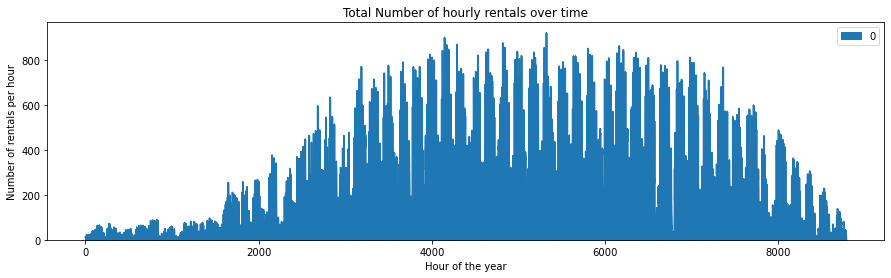

In [34]:
# Create a new column with the hour of the start time
bike['hourofyear'] = bike['start_time'].dt.dayofyear * 24 - 24 + bike['start_time'].dt.hour 

# Group the data by the date and hour of the start time and count the number of entries in each group
bikeplot = bike.groupby([bike['hourofyear']]).size()
bikeplot = bikeplot.to_frame()

# Create a new DataFrame with a sequential index that covers the full range of hours of the year
index = range(bike['hourofyear'].min(), bike['hourofyear'].max()+1)
seqhoy = pd.DataFrame(index=index)

# Merge the bikeplot DataFrame with the new DataFrame using a left join
seqhoy = seqhoy.merge(bikeplot, left_index=True, right_index=True, how='left')

# Fill any missing values with 0
seqhoy = seqhoy.fillna(0)

# Plot the resulting DataFrame
fig, ax = plt.subplots(figsize=(15, 4))
seqhoy.plot.area(ax=ax)
plt.title('Total Number of hourly rentals over time')
ax.set_ylabel('Number of rentals per hour')
ax.set_xlabel('Hour of the year')
plt.show()

**Fleet usage:**

We calculate the hourly as well as the average fleet usage in percent to get an impression of the utilization and slack resources. Overall, utilization is rather low, around 2.0% on average with spikes peeking around 13.0%.

In [35]:
# Total number of added docks per year
total_dock_size = stations.groupby('Deployment Year')['Total docks'].sum()
total_dock_size
# Total dock size in 2016 (assuming there was no loss of formerly built docks and all the docks added in 2016 were added at the beginning of the year)
ds_2016 = sum(total_dock_size[0:2016])
print('Total dock size in 2016:')
print(ds_2016)

bikenr = bike['bike_id'].unique()
bikenr = pd.DataFrame(bikenr)
bikenr.info()
# Total fleet size in 2016 is 1802 bikes (assuming there were no bikes disposed of) and all bikes were operational at the beginning of the year
fs_2016 = 1802
print('Total fleet size in 2016:')
print(fs_2016)

Total dock size in 2016:
2918
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1802 entries, 0 to 1801
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   0       1802 non-null   int64
dtypes: int64(1)
memory usage: 14.2 KB
Total fleet size in 2016:
1802


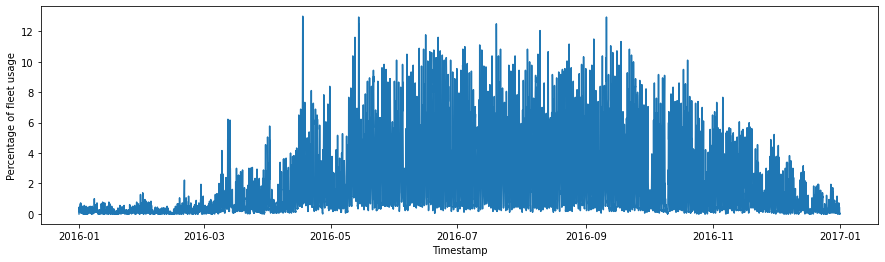

In [36]:
# Create a list of timestamps from 2016-01-01 00:00:00 to 2017-01-01 00:00:00
timestamps = pd.date_range(start='2016-01-01 00:00:00', end='2017-01-01 00:00:00', freq='1H')

# Initialize an empty list to store the number of entries for each timestamp
num_entries = []

# Iterate over the timestamps
for point_in_time in timestamps:
    # Create a boolean series indicating whether the point in time is between the start and end time for each entry
    mask = (bike['start_time'] <= point_in_time) & (point_in_time <= bike['end_time'])
    # Count the number of entries where the point in time is between start and end time
    n = mask.sum() / fs_2016 * 100
    # Append the count to the list
    num_entries.append(n)

# Plot the number of entries over time
fig, ax = plt.subplots(figsize=(15, 4))
plt.plot(timestamps, num_entries)
plt.xlabel('Timestamp')
plt.ylabel('Percentage of fleet usage')
plt.show()

In [37]:
# Define function to get average of a list
def Average(lst):
    return sum(lst) / len(lst)
print('Average fleet usage (%) is:')
Average(num_entries)

Average fleet usage (%) is:


2.02139278623573

**Hourly revenue:**

We calculate hourly revenue based on (current) pricing information of the bikesharing provider. It is important to note that we assume there is no subscription model but customers only because the data does not allow us to calculate the number of subscribers. However, we find the calculations useful as to give an impression of the sales turnover of such a business model. Hourly revenue on average is $ 477.29.

You can find more on bluebikes pricing information at: https://www.bluebikes.com/pricing/single-trip

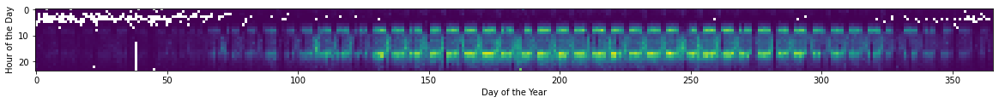

In [38]:
# Calculate the revenue in dollars
bike['revenue'] = np.where(bike['trip_duration'] <= pd.Timedelta(minutes=30), 2.95,
                        np.where(bike['trip_duration'] <= pd.Timedelta(minutes=60), 5.45,
                                 5.45 + 2.5 * np.ceil((bike['trip_duration'].dt.total_seconds() - 60 * 60) / (30 * 60))))

# Group the data by hour and day of the year, and sum the revenue for each hour
hourly_revenue = bike.groupby([bike['end_time'].dt.dayofyear.rename('dayofyear'), bike['end_time'].dt.hour.rename('hour')])['revenue'].sum().reset_index()

# Create a pivot table of the hourly revenue, with the hours as the index and the days of the year as the columns
hourly_revenue_pivot = hourly_revenue.pivot(index='dayofyear', columns='hour', values='revenue')

# Create a heatmap of the pivot table
plt.figure(figsize=(20, 10))
plt.imshow(hourly_revenue_pivot.T, cmap='viridis')
plt.xlabel('Day of the Year')
plt.ylabel('Hour of the Day')
plt.show()

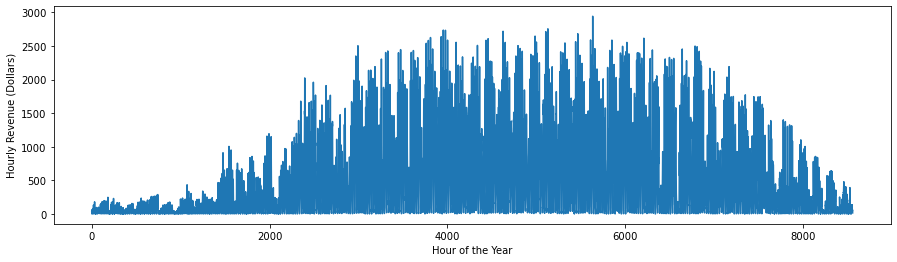

In [39]:
# Reshape the hourly revenue data to have one row for each hour of the year
hourly_revenue_reshaped = hourly_revenue.pivot(index='dayofyear', columns='hour', values='revenue').reset_index(drop=True).stack().reset_index()

# Rename the columns
hourly_revenue_reshaped.columns = ['hour', 'dayofyear', 'revenue']

# Plot the hourly revenue over the year 2016
plt.figure(figsize=(15,4))
plt.plot(hourly_revenue_reshaped['revenue'])
plt.xlabel('Hour of the Year')
plt.ylabel('Hourly Revenue (Dollars)')
plt.show()

In [40]:
hourly_revenue_reshaped.describe()

,hour,dayofyear,revenue
count,8557.000000,8557.000000,8557.000000
mean,185.119434,11.686222,477.291042
std,104.181507,6.889501,547.158296
min,0.000000,0.000000,2.950000
25%,96.000000,6.000000,58.850000
50%,186.000000,12.000000,236.050000
75%,275.000000,18.000000,758.750000
max,365.000000,23.000000,2941.400000


### Weather variation during a day 

In [41]:
weatherhour = weatherhour.drop(columns = ['max_temp','min_temp','precip','interp_maxtemp','interp_mintemp','interp_precip'])
weatherhour_2016 = weatherhour.loc['2016-01-01 00:00:00' : '2016-12-31 23:00:00']
weatherhour_2016 = weatherhour_2016.drop(columns = ['update_mintemp'])

#### Temperature over the year

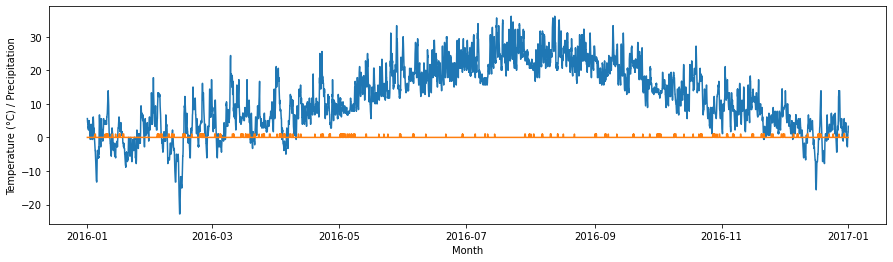

In [42]:
plt.figure(figsize=(15,4))
plt.plot(weatherhour_2016)
plt.xlabel('Month')
plt.ylabel('Temperature (°C) / Precipitation')
plt.show()   

### KPI Dashboard - Additional KPIs

**Average Usage Time...**

In [43]:
# Merging bike and staion datasets
stations.rename(columns={'Name': 'start_station_name'}, inplace=True)
bike_station = pd.merge(bike, stations, on='start_station_name')

In [44]:
bike_station.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_duration,weekday,hourofyear,revenue,Number,Latitude,Longitude,District,Public,Total docks,Deployment Year
0,2016-01-01 00:25:13,2016-01-01 00:43:06,107,176,Ames St at Main St,Lesley University,204,Subscriber,0 days 00:17:53,4,0,2.95,M32037,42.3625,-71.08822,Cambridge,Yes,19,2012.0
1,2016-01-01 08:49:02,2016-01-01 09:09:45,107,73,Ames St at Main St,Harvard Square at Brattle St / Eliot St,1495,Customer,0 days 00:20:43,4,8,2.95,M32037,42.3625,-71.08822,Cambridge,Yes,19,2012.0
2,2016-01-01 16:11:27,2016-01-01 16:15:12,107,117,Ames St at Main St,Binney St / Sixth St,985,Subscriber,0 days 00:03:45,4,16,2.95,M32037,42.3625,-71.08822,Cambridge,Yes,19,2012.0
3,2016-01-01 16:17:39,2016-01-01 17:44:18,107,110,Ames St at Main St,Harvard University Gund Hall at Quincy St / Ki...,1293,Subscriber,0 days 01:26:39,4,16,7.95,M32037,42.3625,-71.08822,Cambridge,Yes,19,2012.0
4,2016-01-01 16:18:19,2016-01-01 17:44:36,107,110,Ames St at Main St,Harvard University Gund Hall at Quincy St / Ki...,1281,Subscriber,0 days 01:26:17,4,16,7.95,M32037,42.3625,-71.08822,Cambridge,Yes,19,2012.0


**... based on Time of Day:**

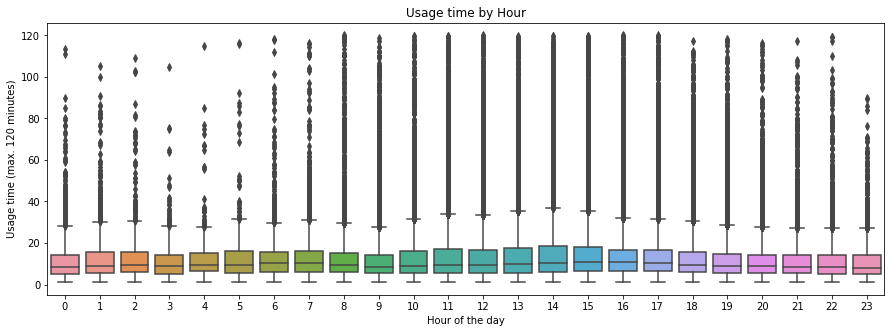

In [45]:
bike_station.groupby(bike_station['start_time'].dt.hour)['trip_duration'].mean()

bs_hour = bike_station
# Extract hour from the timestamp and store it in a new column
bs_hour['hour'] = bs_hour['start_time'].dt.hour

# Convert the timedelta values to minutes if they are less than 1 day
# This excludes entries with trip duration > 7 day
threshold = np.timedelta64(2, 'h')
bs_hour['td_min'] = np.where(bs_hour['trip_duration'] < threshold,
bs_hour['trip_duration'].dt.total_seconds() / 60, np.nan)

# Plotting
rcParams['figure.figsize'] = 15, 5
sns.boxplot(x='hour', y='td_min', data=bs_hour)
plt.title('Usage time by Hour')
plt.xlabel('Hour of the day')
plt.ylabel('Usage time (max. 120 minutes)')
plt.show()

**... based on User Type:**

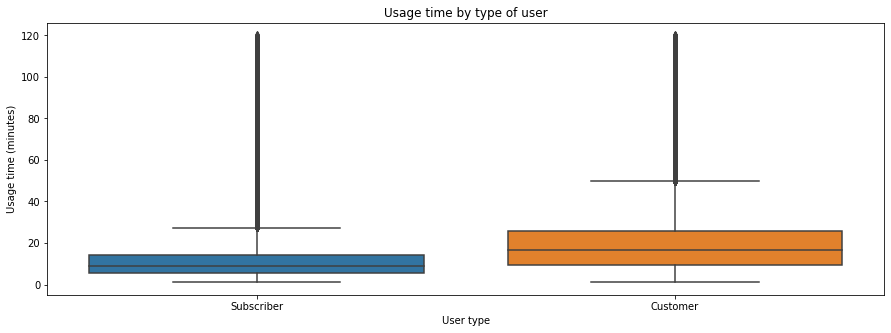

In [46]:
# Plotting
rcParams['figure.figsize'] = 15, 5
sns.boxplot(x='user_type', y='td_min', data=bs_hour)
plt.title('Usage time by type of user')
plt.xlabel('User type')
plt.ylabel('Usage time (minutes)')
plt.show()

**... based on District:**

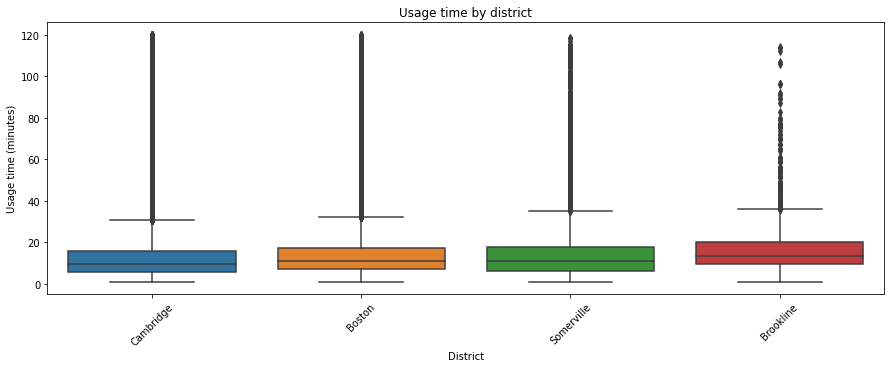

In [47]:
# Plotting
rcParams['figure.figsize'] = 15, 5
sns.boxplot(x='District', y='td_min', data=bs_hour)
plt.title('Usage time by district')
plt.xlabel('District')
plt.ylabel('Usage time (minutes)')
plt.setp(plt.gca().get_xticklabels(), rotation=45)
plt.show()

**Maintenance Management: Total Duration of Usage Time per Bike:**

In [48]:
time_in_use = bike_station.groupby('bike_id')['trip_duration'].sum().reset_index()
time_in_use.sort_values('trip_duration', ascending=False)

,bike_id,trip_duration
1398,1510,6 days 03:52:34.900000
1431,1543,6 days 00:10:13.734000
1389,1501,5 days 19:46:39.955000
1436,1548,5 days 16:39:21.884000
1461,1574,5 days 16:11:48.628000
...,...,...
522,563,0 days 00:14:46
1232,1301,0 days 00:11:21.454000
1584,1716,0 days 00:11:10.696000
1764,1897,0 days 00:05:11


**Most common Trips...**

In [49]:
# Add a new column with a unique trip ID consisting of the start staion and end station ID
bike_tripid = bike
bike_tripid["trip_id"] = bike_tripid["start_station_id"].astype(str) + "-" + bike_tripid["end_station_id"].astype(str) 
bike_tripid.head(5)

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_duration,weekday,hourofyear,revenue,trip_id
0,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber,0 days 00:32:19,4,0,5.45,36-19
1,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber,0 days 00:32:08,4,0,5.45,36-19
2,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber,0 days 00:30:14,4,0,5.45,36-19
3,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber,0 days 00:29:49,4,0,2.95,36-19
4,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer,0 days 00:15:41,4,0,2.95,36-67


...in the entire Year: 

In [50]:
# Create a list of the most common trips and sort by their frequency 
bike_tripid_max = bike_tripid.trip_id.value_counts()[:10000000].to_frame().rename(columns={"trip_id": "counts"}).reset_index().rename(columns={"index": "trip_id"})

# Merge the respective start and end name of the station for better identification of the route 
bike_tripid_max = pd.merge(bike_tripid_max,
                bike_tripid[['trip_id', 'start_station_name', 'end_station_name']],
                on='trip_id',
                how='left')

# Eliminate duplicates by the merge and reindex
bike_tripid_max = bike_tripid_max.drop_duplicates(subset=['trip_id'], ignore_index=True)

# Swap columns for better overview 
bike_tripid_max = bike_tripid_max[["counts", "trip_id", "start_station_name", "end_station_name"]]

bike_tripid_max.head(10)


,counts,trip_id,start_station_name,end_station_name
0,3713,179-80,MIT Vassar St,MIT Stata Center at Vassar St / Main St
1,3113,67-179,MIT at Mass Ave / Amherst St,MIT Vassar St
2,3050,53-67,Beacon St / Mass Ave,MIT at Mass Ave / Amherst St
3,2723,118-100,Linear Park - Mass. Ave. at Cameron Ave.,Davis Square
4,2702,67-53,MIT at Mass Ave / Amherst St,Beacon St / Mass Ave
5,2629,179-67,MIT Vassar St,MIT at Mass Ave / Amherst St
6,2594,100-118,Davis Square,Linear Park - Mass. Ave. at Cameron Ave.
7,2470,178-80,MIT Pacific St at Purrington St,MIT Stata Center at Vassar St / Main St
8,2190,114-100,Teele Square at 239 Holland St,Davis Square
9,2126,80-179,MIT Stata Center at Vassar St / Main St,MIT Vassar St


...for each Hour of the Day:

In [51]:
bike_tripid_hour = bike_tripid

# Extract hour from the timestamp and store it in a new column
bike_tripid_hour['hour'] = bike_tripid_hour['start_time'].dt.hour

# Group by hour and show most common trip ID
bike_tripid_hour = bike_tripid_hour.groupby('hour')['trip_id'].agg(pd.Series.mode).to_frame().reset_index()
bike_tripid_hour

# Merge start station and end station names
bike_tripid_hour = pd.merge(bike_tripid_hour,
                    bike_tripid[['trip_id', 'start_station_name', 'end_station_name']],
                    on='trip_id',
                    how='left')

# Eliminate duplicates by the merge and reindex
bike_tripid_hour = bike_tripid_hour.drop_duplicates(subset=['hour'], ignore_index=True)

bike_tripid_hour

,hour,trip_id,start_station_name,end_station_name
0,0,53-67,Beacon St / Mass Ave,MIT at Mass Ave / Amherst St
1,1,53-67,Beacon St / Mass Ave,MIT at Mass Ave / Amherst St
2,2,53-67,Beacon St / Mass Ave,MIT at Mass Ave / Amherst St
3,3,130-84,Upham's Corner - Ramsey St at Dudley St,CambridgeSide Galleria - CambridgeSide PL at L...
4,4,90-80,Lechmere Station at Cambridge St / First St,MIT Stata Center at Vassar St / Main St
5,5,98-81,Charlestown - Warren St at Chelsea St,Boylston St / Washington St
6,6,109-64,TD Garden - Causeway at Portal Park #1,Congress / Sleeper
7,7,118-100,Linear Park - Mass. Ave. at Cameron Ave.,Davis Square
8,8,118-100,Linear Park - Mass. Ave. at Cameron Ave.,Davis Square
9,9,179-80,MIT Vassar St,MIT Stata Center at Vassar St / Main St


...for each Month:

In [52]:
# Create a list that shows the most frequent trips by month and merge the station names
bike_tripid_max_M = bike_tripid.groupby([pd.Grouper(key='start_time',freq='M')]).trip_id.agg(pd.Series.mode).to_frame().reset_index().rename(columns={"index": "start_time"})
bike_tripid_max_M = pd.merge(bike_tripid_max_M,
                bike_tripid[['trip_id', 'start_station_name', 'end_station_name']],
                on='trip_id',
                how='left')
bike_tripid_max_M = bike_tripid_max_M.drop_duplicates(subset=['start_time'], ignore_index=True)
bike_tripid_max_M

,start_time,trip_id,start_station_name,end_station_name
0,2016-01-31,67-68,MIT at Mass Ave / Amherst St,Central Square at Mass Ave / Essex St
1,2016-02-29,179-67,MIT Vassar St,MIT at Mass Ave / Amherst St
2,2016-03-31,179-80,MIT Vassar St,MIT Stata Center at Vassar St / Main St
3,2016-04-30,118-100,Linear Park - Mass. Ave. at Cameron Ave.,Davis Square
4,2016-05-31,118-100,Linear Park - Mass. Ave. at Cameron Ave.,Davis Square
5,2016-06-30,179-80,MIT Vassar St,MIT Stata Center at Vassar St / Main St
6,2016-07-31,179-80,MIT Vassar St,MIT Stata Center at Vassar St / Main St
7,2016-08-31,179-80,MIT Vassar St,MIT Stata Center at Vassar St / Main St
8,2016-09-30,53-67,Beacon St / Mass Ave,MIT at Mass Ave / Amherst St
9,2016-10-31,53-67,Beacon St / Mass Ave,MIT at Mass Ave / Amherst St


___


## Temporal Demand Patterns and Seasonality

In the following, we want to demonstrate how fleet usage varies with regard to different temporal constellations.

**Fleet Usage Variation during a Day**

Here we calculate the average amount of bookings (counted with start_time) per hour of a day to show how fleet usage changes during a day. We can observe, that there is higher demand for bikes during daytime than at night. Moreover we can see peaks of usage within the so-called 'rush hours': demand for bikes is the highest at 8 am, when people have to get to work, and at 5 pm, when people want to go back to their homes after work.


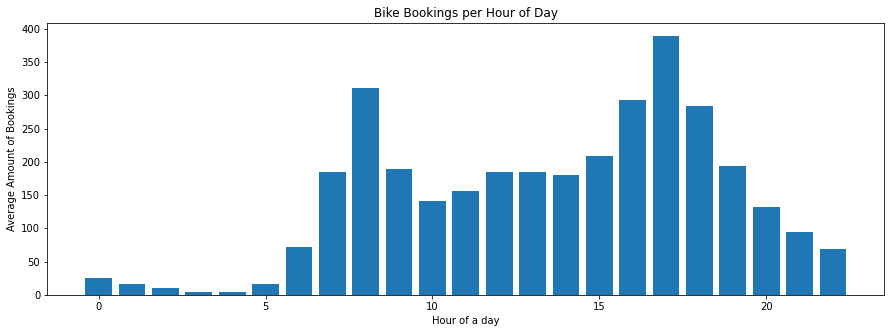

In [53]:
#Count bookings per start_time for each hour of a day (0-23)
#Devide by 365 to get a daily average
hour_of_a_day = []
for i in range(0,23):
    hour_of_a_day.append([i, bike['start_time'].loc[(bike['start_time'].dt.hour) == i].count()/365])
hour_of_a_day = pd.DataFrame(hour_of_a_day)

# Plotting
plt.bar(hour_of_a_day[0], hour_of_a_day[1])
plt.title('Bike Bookings per Hour of Day')
plt.xlabel('Hour of a day')
plt.ylabel('Average Amount of Bookings')
plt.show()


**Fleet Usage Variation during a Week**

Here we calculate the average amount of bookings (counted with start_time) per day of a week (Monday to Sunday) to show how fleet usage changes during a week. We can observe, that there is higher demand for bikes during the week than on weekends. This aligns quite well wtih the findings of the daily variation of fleet usage - bike demand seems to be heavily driven by work.


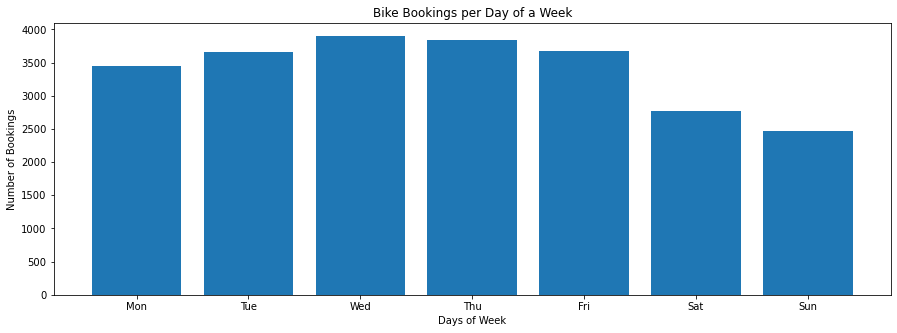

In [54]:
#Count bookings per start_time for each day of a week
#Devide by 52 to get an average value for a week
bike_day_of_a_week = []
for i in range(0,7):
    bike_day_of_a_week.append([i,bike['start_time'].loc[(bike['start_time'].dt.dayofweek) == i].count()/52])
bike_day_of_a_week = pd.DataFrame(bike_day_of_a_week)

#Plotting
days_of_a_week = ['Mon', 'Tue', 'Wed', 'Thu', 'Fri', 'Sat', 'Sun']
plt.bar(days_of_a_week,bike_day_of_a_week[1])
plt.title('Bike Bookings per Day of a Week')
plt.xlabel('Days of Week')
plt.ylabel('Number of Bookings')
plt.show()


**Fleet Usage Variation during a Year**

Here we calculate the total amount of bookings (counted with start_time) on a monthly basis to show how fleet usage changes during a year. We can observe, that there is significantly higher demand for bikes in summer months than during winter. This seems all too understandable, as the weather and temperatures in summer tend to invite cycling


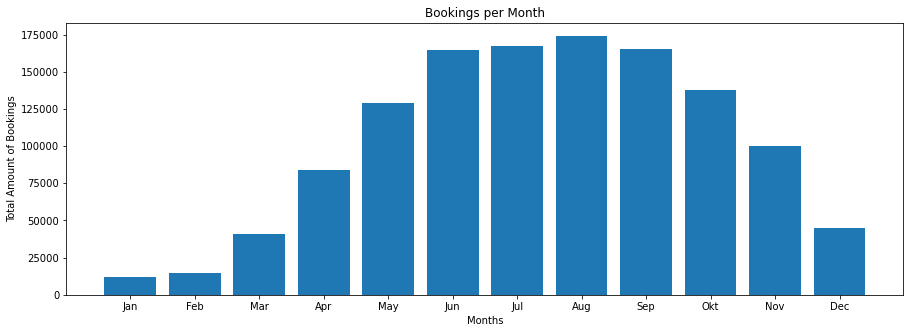

In [55]:
#Count the number of bookings on a monthly basis
bike.index = bike.start_time
bike_month = pd.Series(bike['start_time'].resample('1M').count())

#Plotting
months =['Jan', 'Feb', 'Mar', 'Apr', 'May' , 'Jun' , 'Jul' , 'Aug' , 'Sep' , 'Okt' , 'Nov' , 'Dec']
plt.bar(months,bike_month)
plt.title('Bookings per Month')
plt.xlabel('Months')
plt.ylabel('Total Amount of Bookings')
plt.show()

___

## Geographical Demand Patterns

**Locations of all Bike Stations:**

To display the interactive map, you´ll need the folium package. Just type this into the anaconda prompt:<b>
conda install -c conda-forge folium

In [56]:
#order bike stations by amount of times they are used as start station
start_station_popularity = bike.groupby('start_station_name')
station_popularity = bike.value_counts(['start_station_name']).rename_axis('start_station_name').reset_index(name='counts')
print(station_popularity)

                                    start_station_name  counts
0                         MIT at Mass Ave / Amherst St   35638
1                    South Station - 700 Atlantic Ave.   30100
2                Central Square at Mass Ave / Essex St   24106
3                  Harvard Square at Mass Ave/ Dunster   23159
4              MIT Stata Center at Vassar St / Main St   21175
..                                                 ...     ...
271               Hayes Square - Vine St at Moulton St       4
272  Franklin Park Zoo - Franklin Park Rd at Blue H...       4
273                                          8D OPS 03       2
274                                          8D OPS 01       1
275           Franklin Park - Seaver St at Humbolt Ave       1

[276 rows x 2 columns]


In [57]:
#order bike stations by amount of times they are used as start station
end_station_popularity = bike.groupby('end_station_name')
end_station_popularity = bike.value_counts(['end_station_name']).rename_axis('end_station_name').reset_index(name='counts')
print(end_station_popularity)

                                      end_station_name  counts
0                         MIT at Mass Ave / Amherst St   36099
1                    South Station - 700 Atlantic Ave.   30300
2              MIT Stata Center at Vassar St / Main St   29628
3                  Harvard Square at Mass Ave/ Dunster   24335
4                Central Square at Mass Ave / Essex St   23858
..                                                 ...     ...
269  Franklin Park Zoo - Franklin Park Rd at Blue H...       4
270                       Central Square - East Boston       2
271           Franklin Park - Seaver St at Humbolt Ave       2
272                                          8D OPS 03       2
273                                          8D OPS 01       1

[274 rows x 2 columns]


In [58]:
# Only keep entries with Deployment Year <= 2016
stations2016 = stations.loc[stations['Deployment Year'].isin([2011, 2012, 2013, 2014, 2015, 2016])]
stations2016

,Number,start_station_name,Latitude,Longitude,District,Public,Total docks,Deployment Year
2,A32019,175 N Harvard St,42.363796,-71.129164,Boston,Yes,17,2014.0
6,M32026,359 Broadway - Broadway at Fayette Street,42.370803,-71.104412,Cambridge,Yes,23,2013.0
22,A32032,Airport T Stop - Bremen St at Brooks St,42.374103,-71.032764,Boston,Yes,11,2016.0
24,M32046,Alewife MBTA at Steel Place,42.395588,-71.142606,Cambridge,Yes,19,2016.0
25,M32033,Alewife Station at Russell Field,42.396105,-71.139459,Cambridge,Yes,23,2014.0
...,...,...,...,...,...,...,...,...
435,D32002,Washington St at Waltham St,42.341575,-71.068904,Boston,Yes,15,2011.0
436,C32034,Watermark Seaport - Boston Wharf Rd at Seaport...,42.351586,-71.045693,Boston,Yes,15,2016.0
441,B32021,Wentworth Institute of Technology - Huntington...,42.337586,-71.096271,Boston,Yes,14,2015.0
442,D32022,West End Park,42.365908,-71.064467,Boston,Yes,35,2012.0


In [59]:
station_popularity_2 = stations2016.merge(station_popularity, left_on ='start_station_name',
                  right_on ='start_station_name')[['start_station_name', 'counts']]
print(station_popularity_2)

                                    start_station_name  counts
0                                     175 N Harvard St     238
1            359 Broadway - Broadway at Fayette Street    9710
2              Airport T Stop - Bremen St at Brooks St     166
3                          Alewife MBTA at Steel Place     405
4                     Alewife Station at Russell Field    3145
..                                                 ...     ...
130                          Washington St at Lenox St     114
131                        Washington St at Rutland St     507
132  Watermark Seaport - Boston Wharf Rd at Seaport...     378
133  Wentworth Institute of Technology - Huntington...     169
134                                      Wilson Square    3529

[135 rows x 2 columns]


In [60]:
#merge dataframes to have location data and amount of uses in one dataframe
station_popularity_3 = stations2016.merge(station_popularity, left_on ='start_station_name',
                  right_on ='start_station_name')[['start_station_name', 'counts', 'Latitude', 'Longitude', 'District']]
print(station_popularity_3)

                                    start_station_name  counts   Latitude  \
0                                     175 N Harvard St     238  42.363796   
1            359 Broadway - Broadway at Fayette Street    9710  42.370803   
2              Airport T Stop - Bremen St at Brooks St     166  42.374103   
3                          Alewife MBTA at Steel Place     405  42.395588   
4                     Alewife Station at Russell Field    3145  42.396105   
..                                                 ...     ...        ...   
130                          Washington St at Lenox St     114  42.335099   
131                        Washington St at Rutland St     507  42.338515   
132  Watermark Seaport - Boston Wharf Rd at Seaport...     378  42.351586   
133  Wentworth Institute of Technology - Huntington...     169  42.337586   
134                                      Wilson Square    3529  42.385676   

     Longitude    District  
0   -71.129164      Boston  
1   -71.104412   

In [61]:
# Sort satitons into different popularety categories
def popularity_category (row):
    if row ['counts'] >20000:
        return 'Highest popularity'
    elif row ['counts'] <20000 and row ['counts'] >10000:
        return 'High popularity'
    elif row ['counts'] <10000 and row ['counts'] >5000:
        return 'Medium popularity'
    elif row ['counts'] <5000:
        return 'Lowest popularity'
    return 'Other'

#add new popularity categorie column to the dataframe
station_popularity_3['popularity_category'] = station_popularity_3.apply (lambda row: popularity_category (row), axis=1)
pd.set_option('display.max_rows', None)
print(station_popularity_3)

                                    start_station_name  counts   Latitude  \
0                                     175 N Harvard St     238  42.363796   
1            359 Broadway - Broadway at Fayette Street    9710  42.370803   
2              Airport T Stop - Bremen St at Brooks St     166  42.374103   
3                          Alewife MBTA at Steel Place     405  42.395588   
4                     Alewife Station at Russell Field    3145  42.396105   
5                                   Ames St at Main St   14416  42.362500   
6                   Aquarium T Stop - 200 Atlantic Ave     398  42.359912   
7                        B.U. Central - 725 Comm. Ave.    9655  42.350406   
8          Back Bay T Stop - Dartmouth St at Stuart St     664  42.348074   
9                            Bennington St at Byron St      45  42.383533   
10                                Binney St / Sixth St    7155  42.366088   
11                      Boston City Hall - 28 State St     540  42.358920   

In [62]:
import folium
#Sets the center of the map
popularity_loc_center = [station_popularity_3['Latitude'].mean(), station_popularity_3['Longitude'].mean()] #Sets the center of the map

#Creates map
popularity_map = folium.Map(location = popularity_loc_center, tiles='Openstreetmap', zoom_start = 11, control_scale=True)
#Creates Markers for the bike stations depending on popularity category
for i, row in station_popularity_3.iterrows():
    if row['District'] == 'Somerville' and row['popularity_category'] == 'Highest popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=12, weight=5, color="Yellow", fill_opacity=0.7,fill=True, fill_color="Yellow", popup=row['start_station_name']).add_to(popularity_map)
    elif row['District'] == 'Somerville' and row['popularity_category'] == 'High popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=8, weight=5, color="Yellow", fill_opacity=0.7,fill=True, fill_color="Yellow", popup=row['start_station_name']).add_to(popularity_map)
    elif row['District'] == 'Somerville' and row['popularity_category'] == 'Medium popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=4, weight=5, color="Yellow", fill_opacity=0.7,fill=True, fill_color="Yellow", popup=row['start_station_name']).add_to(popularity_map)
    elif row['District'] == 'Somerville' and row['popularity_category'] == 'Lowest popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=2, weight=5, color="Yellow", fill_opacity=0.7,fill=True, fill_color="Yellow", popup=row['start_station_name']).add_to(popularity_map)
    if row['District'] == 'Boston' and row['popularity_category'] == 'Highest popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=12, weight=5, color="Green", fill_opacity=0.7,fill=True, fill_color="Green", popup=row['start_station_name']).add_to(popularity_map)
    elif row['District'] == 'Boston' and row['popularity_category'] == 'High popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=8, weight=5, color="Green", fill_opacity=0.7,fill=True, fill_color="Green", popup=row['start_station_name']).add_to(popularity_map)
    elif row['District'] == 'Boston' and row['popularity_category'] == 'Medium popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=4, weight=5, color="Green", fill_opacity=0.7,fill=True, fill_color="Green", popup=row['start_station_name']).add_to(popularity_map)
    elif row['District'] == 'Boston' and row['popularity_category'] == 'Lowest popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=2, weight=5, color="Green", fill_opacity=0.7,fill=True, fill_color="Green", popup=row['start_station_name']).add_to(popularity_map)
    if row['District'] == 'Brookline' and row['popularity_category'] == 'Highest popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=12, weight=5, color="Purple", fill_opacity=0.7,fill=True, fill_color="Purple", popup=row['start_station_name']).add_to(popularity_map)
    elif row['District'] == 'Brookline' and row['popularity_category'] == 'High popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=8, weight=5, color="Purple", fill_opacity=0.7,fill=True, fill_color="Purple", popup=row['start_station_name']).add_to(popularity_map)
    elif row['District'] == 'Brookline' and row['popularity_category'] == 'Medium popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=4, weight=5, color="Purple", fill_opacity=0.7, fill=True, fill_color="Purple", popup=row['start_station_name']).add_to(popularity_map)
    elif row['District'] == 'Brookline' and row['popularity_category'] == 'Lowest popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=2, weight=5, color="Purple", fill_opacity=0.7,fill=True, fill_color="Purple", popup=row['start_station_name']).add_to(popularity_map)
    if row['District'] == 'Cambridge' and row['popularity_category'] == 'Highest popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=12, weight=5, color="Red", fill_opacity=0.7, fill=True, fill_color="Red", popup=row['start_station_name']).add_to(popularity_map)
    elif row['District'] == 'Cambridge' and row['popularity_category'] == 'High popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=8, weight=5, color="Red", fill_opacity=0.7,fill=True, fill_color="Red", popup=row['start_station_name']).add_to(popularity_map)
    elif row['District'] == 'Cambridge' and row['popularity_category'] == 'Medium popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=4, weight=5, color="Red", fill_opacity=0.7,fill=True, fill_color="Red", popup=row['start_station_name']).add_to(popularity_map)
    elif row['District'] == 'Cambridge' and row['popularity_category'] == 'Lowest popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=2, weight=5, color="Red", fill_opacity=0.7, fill=True, fill_color="Red", popup=row['start_station_name']).add_to(popularity_map)    
    if row['District'] == 'Watertown' and row['popularity_category'] == 'Highest popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=12, weight=5, color="Orange",fill_opacity=0.7, fill=True, fill_color="Orange", popup=row['start_station_name']).add_to(popularity_map)
    elif row['District'] == 'Watertown' and row['popularity_category'] == 'High popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=8, weight=5, color="Orange",fill_opacity=0.7, fill=True, fill_color="Orange", popup=row['start_station_name']).add_to(popularity_map)
    elif row['District'] == 'Watertown' and row['popularity_category'] == 'Medium popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=4, weight=5, color="Orange",fill_opacity=0.7, fill=True, fill_color="Orange", popup=row['start_station_name']).add_to(popularity_map)
    elif row['District'] == 'Watertown' and row['popularity_category'] == 'Lowest popularity':
        folium.CircleMarker([row['Latitude'], row['Longitude']],radius=2, weight=5, color="Orange", fill_opacity=0.7,fill=True, fill_color="Orange", popup=row['start_station_name']).add_to(popularity_map) 
    
        
folium.LayerControl().add_to(popularity_map)

print('Legend:')
print('Boston: Green')
print('Brookline: Purple')
print('Cambridge: Red')
print('Somerville: Yellow')
print('Watertown: Orange')

popularity_map

Legend:
Boston: Green
Brookline: Purple
Cambridge: Red
Somerville: Yellow
Watertown: Orange


Note that there was a station created in Watertown in 2016 but the district is not included in our rental dataset:

In [63]:
print('Districts of stations operational until (incl.) 2016:')
print(stations2016['District'].unique())
print('')
print('Districts of stations included in our rental data:')
print(bike_station['District'].unique())

Districts of stations operational until (incl.) 2016:
['Boston' 'Cambridge' 'Brookline' 'Somerville' 'Watertown']

Districts of stations included in our rental data:
['Cambridge' 'Boston' 'Somerville' 'Brookline']


It's obvious that the majority of stations in in the Boston main area. Up until 2016 there was only a handful of stations in certain districts adjacent to the Boston district.

___

# 3 Cluster Analysis

___

## Cluster on Locations - Starting Points

In [65]:
bike_station.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_duration,weekday,...,revenue,Number,Latitude,Longitude,District,Public,Total docks,Deployment Year,hour,td_min
0,2016-01-01 00:25:13,2016-01-01 00:43:06,107,176,Ames St at Main St,Lesley University,204,Subscriber,0 days 00:17:53,4,...,2.95,M32037,42.3625,-71.08822,Cambridge,Yes,19,2012.0,0,17.883333
1,2016-01-01 08:49:02,2016-01-01 09:09:45,107,73,Ames St at Main St,Harvard Square at Brattle St / Eliot St,1495,Customer,0 days 00:20:43,4,...,2.95,M32037,42.3625,-71.08822,Cambridge,Yes,19,2012.0,8,20.716667
2,2016-01-01 16:11:27,2016-01-01 16:15:12,107,117,Ames St at Main St,Binney St / Sixth St,985,Subscriber,0 days 00:03:45,4,...,2.95,M32037,42.3625,-71.08822,Cambridge,Yes,19,2012.0,16,3.750000
3,2016-01-01 16:17:39,2016-01-01 17:44:18,107,110,Ames St at Main St,Harvard University Gund Hall at Quincy St / Ki...,1293,Subscriber,0 days 01:26:39,4,...,7.95,M32037,42.3625,-71.08822,Cambridge,Yes,19,2012.0,16,86.650000
4,2016-01-01 16:18:19,2016-01-01 17:44:36,107,110,Ames St at Main St,Harvard University Gund Hall at Quincy St / Ki...,1281,Subscriber,0 days 01:26:17,4,...,7.95,M32037,42.3625,-71.08822,Cambridge,Yes,19,2012.0,16,86.283333


In [66]:
#Analog zur Vorlesung Data Preparation and Scaling
from sklearn.preprocessing import StandardScaler

clusterLocation = pd.DataFrame({'Longitude' : bike_station['Longitude'], 'Latitude' : bike_station['Latitude']})
#clusterLocation.dropna(axis= 0)
#clusterLocation = clusterLocation.reset_index(drop=True)

scaler = StandardScaler()
scaler.fit(clusterLocation)
clusterLocation_scaled = scaler.transform(clusterLocation)
clusterLocation_scaled_df = pd.DataFrame(clusterLocation_scaled, columns=clusterLocation.columns, index=clusterLocation.index)
#clusterLocation_scaled_df = clusterLocation_scaled_df.reset_index(drop=True)
clusterLocation_scaled_df.head()

,Longitude,Latitude
0,0.409818,-0.381403
1,0.409818,-0.381403
2,0.409818,-0.381403
3,0.409818,-0.381403
4,0.409818,-0.381403


In [67]:
clusterLocation_scaled_df.describe()

,Longitude,Latitude
count,5.186270e+05,5.186270e+05
mean,-3.054821e-13,9.119067e-13
std,1.000001e+00,1.000001e+00
min,-3.176508e+00,-5.327813e+00
25%,-7.812099e-01,-4.855399e-01
50%,-1.561991e-01,-1.155265e-01
75%,4.961401e-01,5.208847e-01
max,4.172595e+00,3.288917e+00


In [68]:
clusterLocation_scaled_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 518627 entries, 0 to 518626
Data columns (total 2 columns):
 #   Column     Non-Null Count   Dtype  
---  ------     --------------   -----  
 0   Longitude  518627 non-null  float64
 1   Latitude   518627 non-null  float64
dtypes: float64(2)
memory usage: 11.9 MB


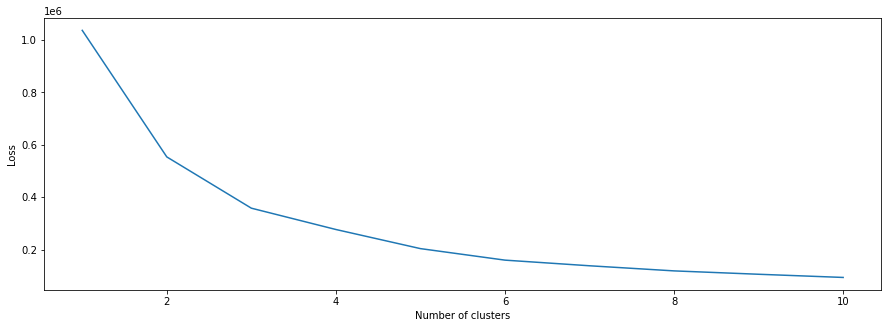

In [69]:
from sklearn.cluster import KMeans
k_max = 10 #möglicherweise ändern

clusters = []
losses = []

for k in range(k_max):
    model = KMeans(n_clusters=k+1)
    model.fit(clusterLocation_scaled)
    clusters.append(k+1)
    losses.append(model.inertia_)
    
plt.plot(clusters, losses)
plt.ylabel("Loss")
plt.xlabel("Number of clusters")
plt.show()

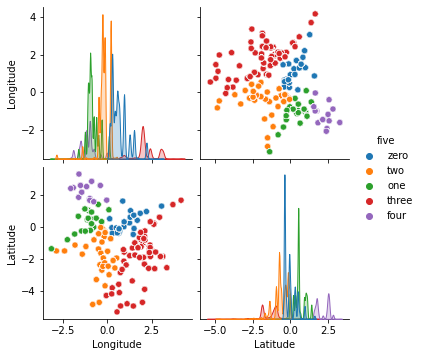

In [70]:
# refit algorithm
five_means = KMeans(n_clusters=5)
five_means.fit(clusterLocation_scaled)

numbers = ["zero", "one", "two", "three", "four", "five", "six"]

clusterLocation_scaled_df["five"] = five_means.predict(clusterLocation_scaled)
clusterLocation_scaled_df["five"] = clusterLocation_scaled_df["five"].apply(lambda x: numbers[x])
sns.pairplot(data=clusterLocation_scaled_df, hue="five")

How to interpret the clusters? Maybe compare to the map and label clusters accordingly. ToDo EndStations!

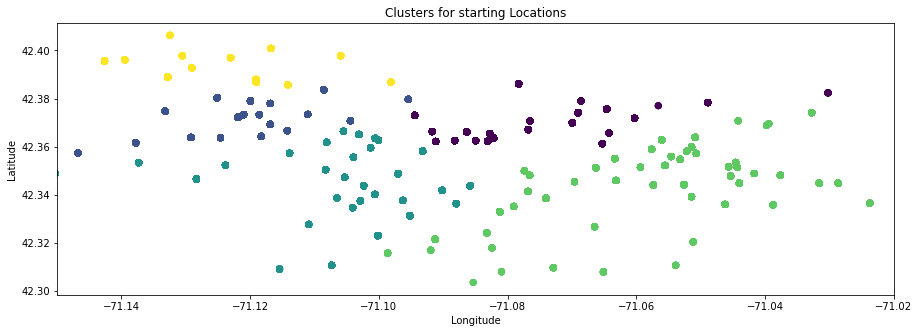

In [71]:
clusterLocation["five"] = five_means.predict(clusterLocation_scaled)

# Plotting
plt.title('Clusters for starting Locations')
plt.scatter(clusterLocation.Longitude, clusterLocation.Latitude, c = clusterLocation["five"])
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.xlim(-71.15, -71.02)
plt.show()

## Cluster for end locations

In [72]:
stations.head()

,Number,start_station_name,Latitude,Longitude,District,Public,Total docks,Deployment Year
0,K32015,1200 Beacon St,42.344149,-71.114674,Brookline,Yes,15,2021.0
1,W32006,160 Arsenal,42.364664,-71.175694,Watertown,Yes,11,2021.0
2,A32019,175 N Harvard St,42.363796,-71.129164,Boston,Yes,17,2014.0
3,S32035,191 Beacon St,42.380323,-71.108786,Somerville,Yes,19,2018.0
4,C32094,2 Hummingbird Lane at Olmsted Green,42.288870,-71.095003,Boston,Yes,17,2020.0


In [73]:
bike.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_duration,weekday,hourofyear,revenue,trip_id,hour
start_time,,,,,,,,,,,,,,
2016-01-01 00:08:07,2016-01-01 00:08:07,2016-01-01 00:40:26,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1406,Subscriber,0 days 00:32:19,4,0,5.45,36-19,0
2016-01-01 00:08:19,2016-01-01 00:08:19,2016-01-01 00:40:27,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1121,Subscriber,0 days 00:32:08,4,0,5.45,36-19,0
2016-01-01 00:10:15,2016-01-01 00:10:15,2016-01-01 00:40:29,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,474,Subscriber,0 days 00:30:14,4,0,5.45,36-19,0
2016-01-01 00:10:22,2016-01-01 00:10:22,2016-01-01 00:40:11,36,19,Boston Public Library - 700 Boylston St.,Buswell St. at Park Dr.,1504,Subscriber,0 days 00:29:49,4,0,2.95,36-19,0
2016-01-01 00:15:36,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer,0 days 00:15:41,4,0,2.95,36-67,0


In [74]:
# Merging bike and staion datasets
stations.rename(columns={'start_station_name': 'end_station_name'}, inplace=True)
bike_station_end = pd.merge(bike, stations, on='end_station_name')
bike_station_end.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_duration,weekday,...,revenue,trip_id,hour,Number,Latitude,Longitude,District,Public,Total docks,Deployment Year
0,2016-01-01 00:15:36,2016-01-01 00:31:17,36,67,Boston Public Library - 700 Boylston St.,MIT at Mass Ave / Amherst St,913,Customer,0 days 00:15:41,4,...,2.95,36-67,0,M32006,42.3581,-71.093198,Cambridge,Yes,27,2012.0
1,2016-01-01 12:32:22,2016-01-01 12:37:25,179,67,MIT Vassar St,MIT at Mass Ave / Amherst St,708,Subscriber,0 days 00:05:03,4,...,2.95,179-67,12,M32006,42.3581,-71.093198,Cambridge,Yes,27,2012.0
2,2016-01-01 13:30:07,2016-01-01 13:48:26,96,67,Cambridge Main Library at Broadway / Trowbridg...,MIT at Mass Ave / Amherst St,691,Subscriber,0 days 00:18:19,4,...,2.95,96-67,13,M32006,42.3581,-71.093198,Cambridge,Yes,27,2012.0
3,2016-01-01 13:36:52,2016-01-01 13:40:32,178,67,MIT Pacific St at Purrington St,MIT at Mass Ave / Amherst St,387,Subscriber,0 days 00:03:40,4,...,2.95,178-67,13,M32006,42.3581,-71.093198,Cambridge,Yes,27,2012.0
4,2016-01-01 13:59:39,2016-01-01 14:02:40,178,67,MIT Pacific St at Purrington St,MIT at Mass Ave / Amherst St,754,Subscriber,0 days 00:03:01,4,...,2.95,178-67,13,M32006,42.3581,-71.093198,Cambridge,Yes,27,2012.0


In [75]:
#Analog zur Vorlesung Data Preparation and Scaling
from sklearn.preprocessing import StandardScaler

clusterLocationEnd = pd.DataFrame({'Longitude' : bike_station_end['Longitude'], 'Latitude' : bike_station_end['Latitude']})
#clusterLocation.dropna(axis= 0)
#clusterLocation = clusterLocation.reset_index(drop=True)

scaler = StandardScaler()
scaler.fit(clusterLocationEnd)
clusterLocationEnd_scaled = scaler.transform(clusterLocationEnd)
clusterLocationEnd_scaled_df = pd.DataFrame(clusterLocationEnd_scaled, columns=clusterLocationEnd.columns, index=clusterLocationEnd.index)
#clusterLocation_scaled_df = clusterLocation_scaled_df.reset_index(drop=True)
clusterLocationEnd_scaled_df.head()

,Longitude,Latitude
0,0.170615,-0.753404
1,0.170615,-0.753404
2,0.170615,-0.753404
3,0.170615,-0.753404
4,0.170615,-0.753404


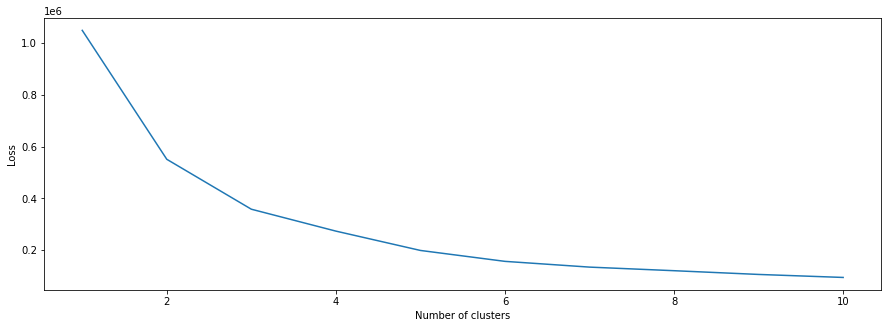

In [76]:
from sklearn.cluster import KMeans
k_max = 10 #möglicherweise ändern

clusters = []
losses = []

for k in range(k_max):
    model = KMeans(n_clusters=k+1)
    model.fit(clusterLocationEnd_scaled)
    clusters.append(k+1)
    losses.append(model.inertia_)
    
plt.plot(clusters, losses)
plt.ylabel("Loss")
plt.xlabel("Number of clusters")
plt.show()

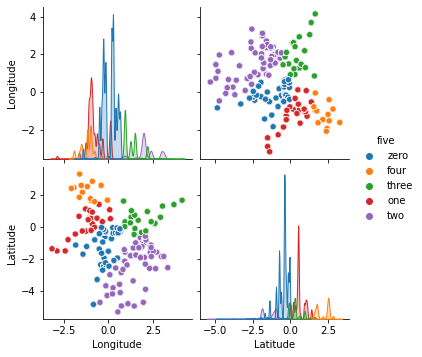

In [77]:
# refit algorithm
five_means = KMeans(n_clusters=5)
five_means.fit(clusterLocationEnd_scaled)

numbers = ["zero", "one", "two", "three", "four", "five", "six"]

clusterLocationEnd_scaled_df["five"] = five_means.predict(clusterLocationEnd_scaled)
clusterLocationEnd_scaled_df["five"] = clusterLocationEnd_scaled_df["five"].apply(lambda x: numbers[x])
sns.pairplot(data=clusterLocationEnd_scaled_df, hue="five")

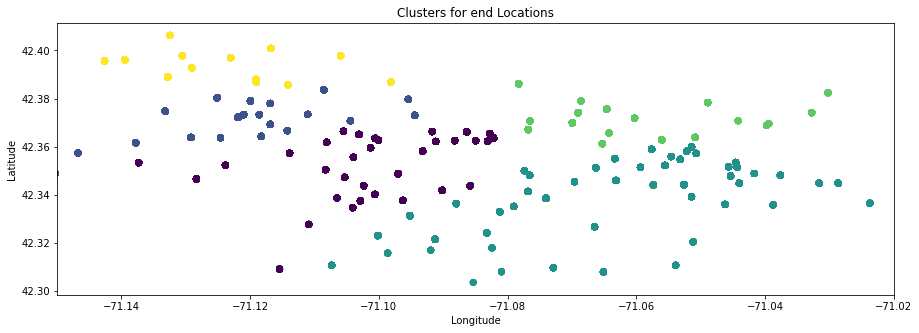

In [78]:
clusterLocationEnd["five"] = five_means.predict(clusterLocationEnd_scaled)

# Plotting
plt.title('Clusters for end Locations')
plt.scatter(clusterLocationEnd.Longitude, clusterLocationEnd.Latitude, c = clusterLocationEnd["five"])
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.xlim(-71.15, -71.02)
plt.show()

## Bike Demand Pattern Cluster - Trip Durations on Starting Times

In [79]:
clusterTime = pd.DataFrame({'Start_Time' : bike_station['start_time'].dt.hour+(bike_station['start_time'].dt.minute)/60, 'Trip_Length' : bike_station['trip_duration']/pd.Timedelta(minutes=1)})
scaler = StandardScaler()
scaler.fit(clusterTime)
clusterTime_scaled = scaler.transform(clusterTime)
clusterTime_scaled_df = pd.DataFrame(clusterTime_scaled, columns=clusterTime.columns, index=clusterTime.index)
clusterTime_scaled_df.head()

,Start_Time,Trip_Length
0,-3.043787,0.108347
1,-1.238254,0.193301
2,0.345169,-0.315423
3,0.366664,2.170228
4,0.370246,2.159234


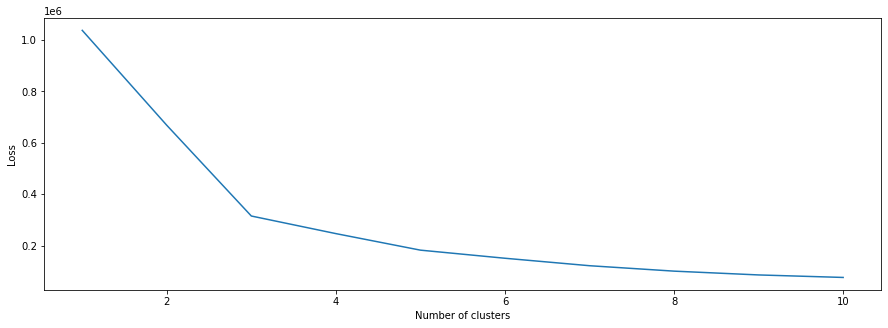

In [80]:
k_max = 10 #möglicherweise ändern

clusters = []
losses = []

for k in range(k_max):
    model = KMeans(n_clusters=k+1)
    model.fit(clusterTime_scaled)
    clusters.append(k+1)
    losses.append(model.inertia_)
    
plt.plot(clusters, losses)
plt.ylabel("Loss")
plt.xlabel("Number of clusters")
plt.show()

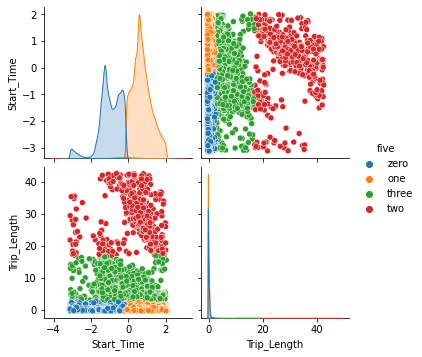

In [81]:
# refit algorithm
five_means = KMeans(n_clusters=4)
five_means.fit(clusterTime_scaled)

numbers = ["zero", "one", "two", "three", "four", "five", "six"]

clusterTime_scaled_df["five"] = five_means.predict(clusterTime_scaled)
clusterTime_scaled_df["five"] = clusterTime_scaled_df["five"].apply(lambda x: numbers[x])
sns.pairplot(data=clusterTime_scaled_df, hue="five")

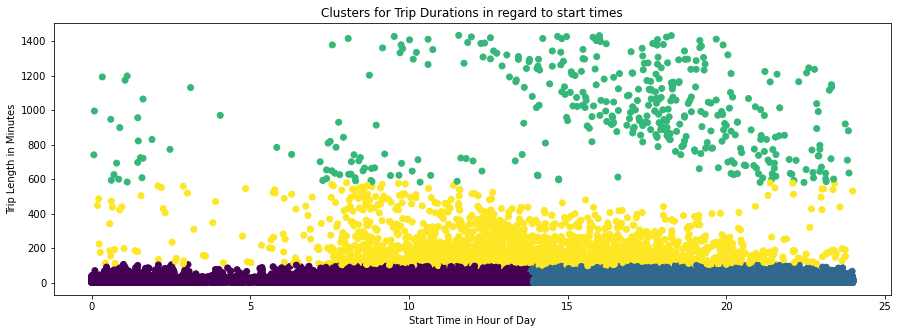

In [82]:
clusterTime["five"] = five_means.predict(clusterTime_scaled)

# Plotting
plt.title('Clusters for Trip Durations in regard to start times')
plt.scatter(clusterTime.Start_Time, clusterTime.Trip_Length, c = clusterTime["five"])
plt.xlabel('Start Time in Hour of Day')
plt.ylabel('Trip Length in Minutes')
#plt.xlim(0, 24)
plt.show()

## Bike Demand Pattern Cluster - Trip Durations on Days of a Year

In [83]:
clusterTimeDays = pd.DataFrame({'Start_Time' : bike_station['start_time'].dt.dayofyear, 'Trip_Length' : bike_station['trip_duration']/pd.Timedelta(minutes=1)})
scaler = StandardScaler()
scaler.fit(clusterTimeDays)
clusterTimeDays_scaled = scaler.transform(clusterTimeDays)
clusterTimeDays_scaled_df = pd.DataFrame(clusterTimeDays_scaled, columns=clusterTimeDays.columns, index=clusterTimeDays.index)
clusterTimeDays_scaled_df.head()

,Start_Time,Trip_Length
0,-2.503487,0.108347
1,-2.503487,0.193301
2,-2.503487,-0.315423
3,-2.503487,2.170228
4,-2.503487,2.159234


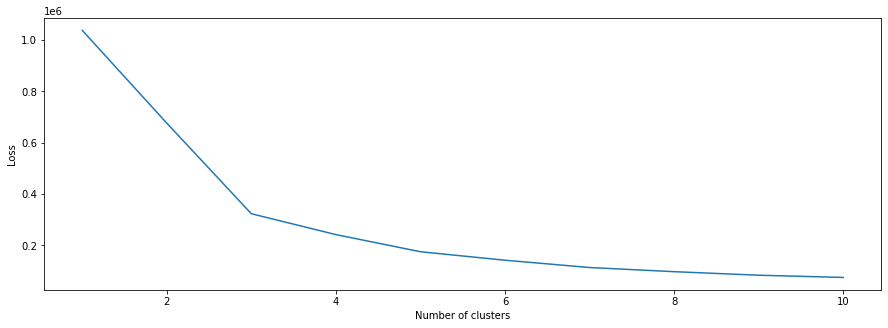

In [84]:
k_max = 10 #möglicherweise ändern

clusters = []
losses = []

for k in range(k_max):
    model = KMeans(n_clusters=k+1)
    model.fit(clusterTimeDays_scaled)
    clusters.append(k+1)
    losses.append(model.inertia_)
    
plt.plot(clusters, losses)
plt.ylabel("Loss")
plt.xlabel("Number of clusters")
plt.show()

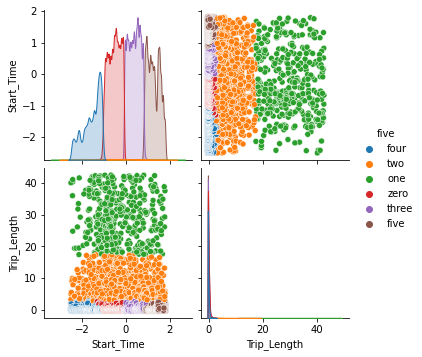

In [85]:
# refit algorithm
five_means = KMeans(n_clusters=6)
five_means.fit(clusterTimeDays_scaled)

numbers = ["zero", "one", "two", "three", "four", "five", "six"]

clusterTimeDays_scaled_df["five"] = five_means.predict(clusterTimeDays_scaled)
clusterTimeDays_scaled_df["five"] = clusterTimeDays_scaled_df["five"].apply(lambda x: numbers[x])
sns.pairplot(data=clusterTimeDays_scaled_df, hue="five")

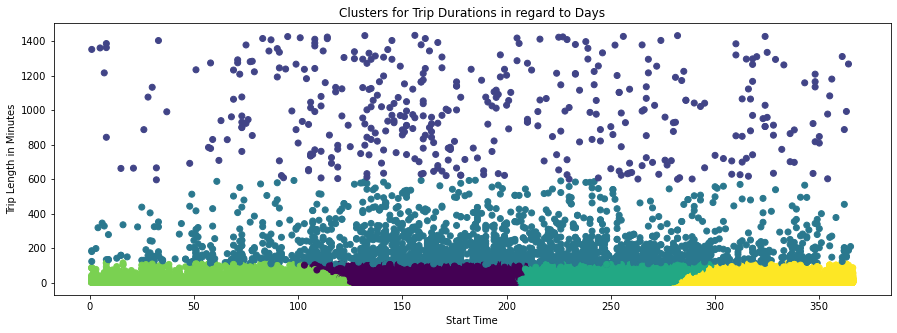

In [86]:
clusterTimeDays["five"] = five_means.predict(clusterTimeDays_scaled)

# Plotting
plt.title('Clusters for Trip Durations in regard to Days')
plt.scatter(clusterTimeDays.Start_Time, clusterTimeDays.Trip_Length, c = clusterTimeDays["five"])
plt.xlabel('Start Time')
plt.ylabel('Trip Length in Minutes')
plt.show()

## Clusters on seasonal basis

In [87]:
bike_station_alt = bike_station
#bike_station_alt['start_time_date'] = pd.to_datetime(bike_station['start_time']).dt.date
#bike_station_alt['start_time_time'] = pd.to_datetime(bike_station['start_time']).dt.time
bike_station_alt.head()

,start_time,end_time,start_station_id,end_station_id,start_station_name,end_station_name,bike_id,user_type,trip_duration,weekday,...,revenue,Number,Latitude,Longitude,District,Public,Total docks,Deployment Year,hour,td_min
0,2016-01-01 00:25:13,2016-01-01 00:43:06,107,176,Ames St at Main St,Lesley University,204,Subscriber,0 days 00:17:53,4,...,2.95,M32037,42.3625,-71.08822,Cambridge,Yes,19,2012.0,0,17.883333
1,2016-01-01 08:49:02,2016-01-01 09:09:45,107,73,Ames St at Main St,Harvard Square at Brattle St / Eliot St,1495,Customer,0 days 00:20:43,4,...,2.95,M32037,42.3625,-71.08822,Cambridge,Yes,19,2012.0,8,20.716667
2,2016-01-01 16:11:27,2016-01-01 16:15:12,107,117,Ames St at Main St,Binney St / Sixth St,985,Subscriber,0 days 00:03:45,4,...,2.95,M32037,42.3625,-71.08822,Cambridge,Yes,19,2012.0,16,3.750000
3,2016-01-01 16:17:39,2016-01-01 17:44:18,107,110,Ames St at Main St,Harvard University Gund Hall at Quincy St / Ki...,1293,Subscriber,0 days 01:26:39,4,...,7.95,M32037,42.3625,-71.08822,Cambridge,Yes,19,2012.0,16,86.650000
4,2016-01-01 16:18:19,2016-01-01 17:44:36,107,110,Ames St at Main St,Harvard University Gund Hall at Quincy St / Ki...,1281,Subscriber,0 days 01:26:17,4,...,7.95,M32037,42.3625,-71.08822,Cambridge,Yes,19,2012.0,16,86.283333


In [88]:
# Aufteilung annäherungsweise gemäß obrigen Cluster, siehe auch https://www.kalender-365.eu/tag-nummern/2016.html
bike_station_first = pd.DataFrame({'Boolean' : bike_station['start_time'].
                                   between('2016-01-01','2016-04-29', inclusive=True),
                                   'Start_Time' : bike_station['start_time'],
                                   'Trip_Length': bike_station['trip_duration']/pd.Timedelta(minutes=1)})
bike_station_second = pd.DataFrame({'Boolean' : bike_station['start_time'].
                                   between('2016-04-30','2016-07-28', inclusive=True),
                                   'Start_Time' : bike_station['start_time'],
                                   'Trip_Length': bike_station['trip_duration']/pd.Timedelta(minutes=1)})
bike_station_third = pd.DataFrame({'Boolean' : bike_station['start_time'].
                                   between('2016-07-29','2016-10-06', inclusive=True),
                                   'Start_Time' : bike_station['start_time'],
                                   'Trip_Length': bike_station['trip_duration']/pd.Timedelta(minutes=1)})
bike_station_fourth = pd.DataFrame({'Boolean' : bike_station['start_time'].
                                   between('2016-10-07','2016-12-31', inclusive=True),
                                   'Start_Time' : bike_station['start_time'],
                                   'Trip_Length': bike_station['trip_duration']/pd.Timedelta(minutes=1)})

#Eliminierung von Daten außerhalb der Bereiche
bike_station_first = bike_station_first[bike_station_first['Boolean'] == True]
bike_station_second = bike_station_second[bike_station_second['Boolean'] == True]
bike_station_third = bike_station_third[bike_station_third['Boolean'] == True]
bike_station_fourth = bike_station_fourth[bike_station_fourth['Boolean'] == True]

bike_station_second.head()

C:\Users\Martin\AppData\Local\Temp\ipykernel_6468\3990627009.py:2: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated in favour of `both` or `neither`.
  bike_station_first = pd.DataFrame({'Boolean' : bike_station['start_time'].
C:\Users\Martin\AppData\Local\Temp\ipykernel_6468\3990627009.py:6: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated in favour of `both` or `neither`.
  bike_station_second = pd.DataFrame({'Boolean' : bike_station['start_time'].
C:\Users\Martin\AppData\Local\Temp\ipykernel_6468\3990627009.py:10: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated in favour of `both` or `neither`.
  bike_station_third = pd.DataFrame({'Boolean' : bike_station['start_time'].
C:\Users\Martin\AppData\Local\Temp\ipykernel_6468\3990627009.py:14: FutureWarning: Boolean inputs to the `inclusive` argument are deprecated in favour of `both` or `neither`.
  bike_station_fourth = pd.DataFrame({'Boolean' : bike_station['start_

,Boolean,Start_Time,Trip_Length
3103,True,2016-04-30 00:05:12,25.266667
3104,True,2016-04-30 00:23:04,11.133333
3105,True,2016-04-30 09:25:52,19.250000
3106,True,2016-04-30 10:48:05,19.616667
3107,True,2016-04-30 10:48:13,19.350000


In [89]:
clusterTimeFirst = pd.DataFrame({
    'Start_Time' : (bike_station_first['Start_Time'].dt.hour)+(bike_station_first['Start_Time'].dt.minute)/60,
    'Trip_Length': bike_station_first['Trip_Length']})
clusterTimeSecond = pd.DataFrame({
    'Start_Time' : (bike_station_second['Start_Time'].dt.hour)+(bike_station_second['Start_Time'].dt.minute)/60,
    'Trip_Length': bike_station_second['Trip_Length']})
clusterTimeThird = pd.DataFrame({
    'Start_Time' : (bike_station_third['Start_Time'].dt.hour)+(bike_station_third['Start_Time'].dt.minute)/60,
    'Trip_Length': bike_station_third['Trip_Length']})
clusterTimeFourth = pd.DataFrame({
    'Start_Time' : (bike_station_fourth['Start_Time'].dt.hour)+(bike_station_fourth['Start_Time'].dt.minute)/60,
    'Trip_Length': bike_station_fourth['Trip_Length']})


scaler = StandardScaler()
#1
scaler.fit(clusterTimeFirst)
clusterTimeFirst_scaled = scaler.transform(clusterTimeFirst)
clusterTimeFirst_scaled_df = pd.DataFrame(clusterTimeFirst_scaled, columns=clusterTimeFirst.columns, index=clusterTimeFirst.index)
#2
scaler.fit(clusterTimeSecond)
clusterTimeSecond_scaled = scaler.transform(clusterTimeSecond)
clusterTimeSecond_scaled_df = pd.DataFrame(clusterTimeSecond_scaled, columns=clusterTimeSecond.columns, index=clusterTimeSecond.index)
#3
scaler.fit(clusterTimeThird)
clusterTimeThird_scaled = scaler.transform(clusterTimeThird)
clusterTimeThird_scaled_df = pd.DataFrame(clusterTimeThird_scaled, columns=clusterTimeThird.columns, index=clusterTimeThird.index)
#4
scaler.fit(clusterTimeFourth)
clusterTimeFourth_scaled = scaler.transform(clusterTimeFourth)
clusterTimeFourth_scaled_df = pd.DataFrame(clusterTimeFourth_scaled, columns=clusterTimeFourth.columns, index=clusterTimeFourth.index)

clusterTimeFirst_scaled_df.head()

,Start_Time,Trip_Length
0,-3.084632,0.115639
1,-1.265662,0.185885
2,0.329546,-0.234767
3,0.351200,1.820560
4,0.354809,1.811470


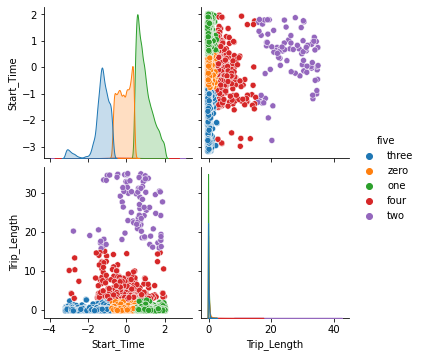

In [90]:
# refit algorithm
five_means = KMeans(n_clusters=5)
five_means.fit(clusterTimeFirst_scaled)

numbers = ["zero", "one", "two", "three", "four", "five", "six"]

clusterTimeFirst_scaled_df["five"] = five_means.predict(clusterTimeFirst_scaled)
clusterTimeFirst_scaled_df["five"] = clusterTimeFirst_scaled_df["five"].apply(lambda x: numbers[x])
sns.pairplot(data=clusterTimeFirst_scaled_df, hue="five")

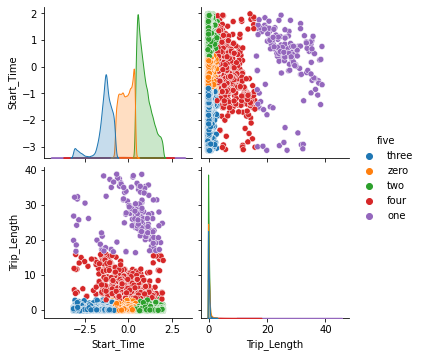

In [91]:
# refit algorithm
five_means = KMeans(n_clusters=5)
five_means.fit(clusterTimeSecond_scaled)

numbers = ["zero", "one", "two", "three", "four", "five", "six"]

clusterTimeSecond_scaled_df["five"] = five_means.predict(clusterTimeSecond_scaled)
clusterTimeSecond_scaled_df["five"] = clusterTimeSecond_scaled_df["five"].apply(lambda x: numbers[x])
sns.pairplot(data=clusterTimeSecond_scaled_df, hue="five")

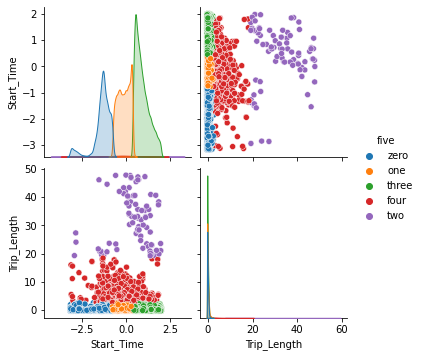

In [92]:
# refit algorithm
five_means = KMeans(n_clusters=5)
five_means.fit(clusterTimeThird_scaled)

numbers = ["zero", "one", "two", "three", "four", "five", "six"]

clusterTimeThird_scaled_df["five"] = five_means.predict(clusterTimeThird_scaled)
clusterTimeThird_scaled_df["five"] = clusterTimeThird_scaled_df["five"].apply(lambda x: numbers[x])
sns.pairplot(data=clusterTimeThird_scaled_df, hue="five")

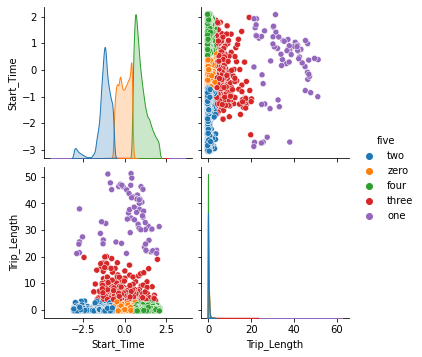

In [93]:
# refit algorithm
five_means = KMeans(n_clusters=5)
five_means.fit(clusterTimeFourth_scaled)

numbers = ["zero", "one", "two", "three", "four", "five", "six"]

clusterTimeFourth_scaled_df["five"] = five_means.predict(clusterTimeFourth_scaled)
clusterTimeFourth_scaled_df["five"] = clusterTimeFourth_scaled_df["five"].apply(lambda x: numbers[x])
sns.pairplot(data=clusterTimeFourth_scaled_df, hue="five")

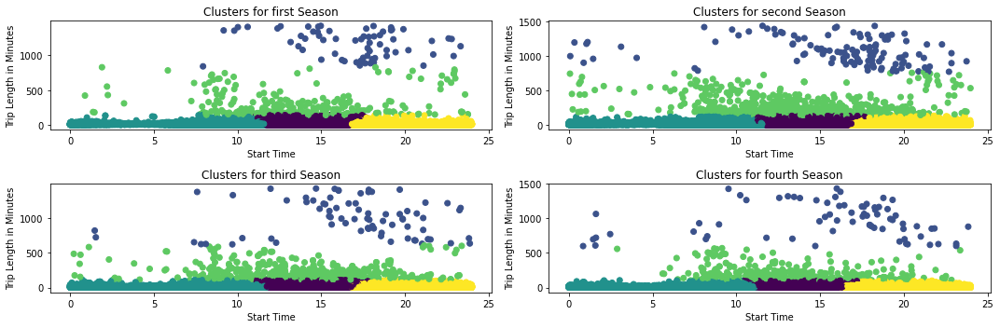

In [94]:
clusterTimeFirst["five"] = five_means.predict(clusterTimeFirst_scaled)
clusterTimeSecond["five"] = five_means.predict(clusterTimeSecond_scaled)
clusterTimeThird["five"] = five_means.predict(clusterTimeThird_scaled)
clusterTimeFourth["five"] = five_means.predict(clusterTimeFourth_scaled)

# Plotting
subplot1 = plt.subplot(221)
subplot1.set_title('Clusters for first Season')
subplot1.scatter(clusterTimeFirst.Start_Time, clusterTimeFirst.Trip_Length, c = clusterTimeFirst["five"])
subplot1.set_xlabel('Start Time')
subplot1.set_ylabel('Trip Length in Minutes')

subplot2 = plt.subplot(222)
subplot2.set_title('Clusters for second Season')
subplot2.scatter(clusterTimeSecond.Start_Time, clusterTimeSecond.Trip_Length, c = clusterTimeSecond["five"])
subplot2.set_xlabel('Start Time')
subplot2.set_ylabel('Trip Length in Minutes')

subplot3 = plt.subplot(223)
subplot3.set_title('Clusters for third Season')
subplot3.scatter(clusterTimeThird.Start_Time, clusterTimeThird.Trip_Length, c = clusterTimeThird["five"])
subplot3.set_xlabel('Start Time')
subplot3.set_ylabel('Trip Length in Minutes')

subplot4 = plt.subplot(224)
subplot4.set_title('Clusters for fourth Season')
subplot4.scatter(clusterTimeFourth.Start_Time, clusterTimeFourth.Trip_Length, c = clusterTimeFourth["five"])
subplot4.set_xlabel('Start Time')
subplot4.set_ylabel('Trip Length in Minutes')

plt.tight_layout()
plt.show()

____

# 4 Predictive Analytics

___

In [95]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.metrics import mean_squared_error
from sklearn.preprocessing import PolynomialFeatures

### Feature Engineering:

The variable we are going to predict is the number of bookings per hour ('counts'). As input features for our prediction models we decided on some time-based features, specifically the hour of the day ('hourofday'), the day of the week ('weekday'), and the month ('month'), as we expect a significant influence of all of these based on the descriptive analytics we have conducted. Furthermore, combine the booking data with the weather data for the Boston area to incorporate the average temperature ('temp_av') and precipitation ('update_precip') as additional input features in our models.

In [96]:
pred_model = pd.read_csv("Pred_Model.csv")

pred_model['start_time'] = pd.to_datetime(pred_model['start_time'])
pred_model['end_time'] = pd.to_datetime(pred_model['end_time'])

In [97]:
pred_model_counts = pred_model.groupby([pd.Grouper(key='start_time', freq = 'H')]).size().to_frame('counts')

print('Total number of booked trips in 2016 is:')
pred_model_counts["counts"].sum()

Total number of booked trips in 2016 is:


1235121

In [98]:
# Make index to column to create day of week and month based on date
pred_model_counts['index1'] = pred_model_counts.index
pred_model_counts["hourofday"] = pred_model_counts["index1"].dt.hour
pred_model_counts["weekday"] = pred_model_counts["index1"].dt.dayofweek
pred_model_counts["month"] = pred_model_counts["index1"].dt.month

pred_model_counts = pred_model_counts.drop('index1', axis=1)

pred_model_counts.index.names = ['daytime']
pred_model_counts.index = pd.to_datetime(pred_model_counts.index)
pred_model_counts

,counts,hourofday,weekday,month
daytime,,,,
2016-01-01 00:00:00,13,0,4,1
2016-01-01 01:00:00,14,1,4,1
2016-01-01 02:00:00,9,2,4,1
2016-01-01 03:00:00,1,3,4,1
2016-01-01 04:00:00,0,4,4,1
2016-01-01 05:00:00,0,5,4,1
2016-01-01 06:00:00,1,6,4,1
2016-01-01 07:00:00,3,7,4,1
2016-01-01 08:00:00,3,8,4,1


**Import weather and merge with bike data:**

In [99]:
weather_hourly = pd.read_csv('weather_hourly.csv')
weather_hourly.head()

,Unnamed: 0,max_temp,min_temp,precip,interp_maxtemp,interp_mintemp,interp_precip,update_maxtemp,update_mintemp,update_precip
0,2015-01-01 06:00:00,-5.6,-5.6,0.0,-5.6,-5.6,0.0,-5.6,-5.6,0.0
1,2015-01-01 07:00:00,-5.6,-5.6,0.0,-5.6,-5.6,0.0,-5.6,-5.6,0.0
2,2015-01-01 08:00:00,-5.6,-5.6,0.0,-5.6,-5.6,0.0,-5.6,-5.6,0.0
3,2015-01-01 09:00:00,-4.4,-4.4,0.0,-4.4,-4.4,0.0,-4.4,-4.4,0.0
4,2015-01-01 10:00:00,-5.6,-5.6,0.0,-5.6,-5.6,0.0,-5.6,-5.6,0.0


In [100]:
weatherhour = weather_hourly.drop(columns = ['max_temp','min_temp','precip','interp_maxtemp','interp_mintemp','interp_precip'])
weatherhour['temp_av'] = (weatherhour['update_maxtemp'] + weatherhour['update_mintemp']) / 2
weatherhour = weatherhour.drop(columns = ['update_mintemp', 'update_maxtemp'])
weatherhour = weatherhour.set_index('Unnamed: 0')
weatherhour.index.names = ['daytime']
weatherhour.index = pd.to_datetime(weatherhour.index)
weatherhour = weatherhour.loc['2016-01-01 00:00:00' : '2017-01-01 00:00:00']
weatherhour

,update_precip,temp_av
daytime,,
2016-01-01 00:00:00,0.000000,5.600000
2016-01-01 01:00:00,0.000000,5.000000
2016-01-01 02:00:00,0.000000,5.000000
2016-01-01 03:00:00,0.000000,4.400000
2016-01-01 04:00:00,0.000000,4.400000
2016-01-01 05:00:00,0.000000,3.900000
2016-01-01 06:00:00,0.000000,3.900000
2016-01-01 07:00:00,0.000000,3.900000
2016-01-01 08:00:00,0.000000,3.300000


In [101]:
pred_model_joint = pred_model_counts.join(weatherhour, how="left")
pred_model_joint

,counts,hourofday,weekday,month,update_precip,temp_av
daytime,,,,,,
2016-01-01 00:00:00,13,0,4,1,0.000000,5.600000
2016-01-01 01:00:00,14,1,4,1,0.000000,5.000000
2016-01-01 02:00:00,9,2,4,1,0.000000,5.000000
2016-01-01 03:00:00,1,3,4,1,0.000000,4.400000
2016-01-01 04:00:00,0,4,4,1,0.000000,4.400000
2016-01-01 05:00:00,0,5,4,1,0.000000,3.900000
2016-01-01 06:00:00,1,6,4,1,0.000000,3.900000
2016-01-01 07:00:00,3,7,4,1,0.000000,3.900000
2016-01-01 08:00:00,3,8,4,1,0.000000,3.300000


We randomly split the dataset into training data and houldout set and run some comparitive statistics, showing an equal distribution of feature values across both data sets.

In [102]:
from sklearn.model_selection import train_test_split

# Extract the relevant features from the dataset
X = pred_model_joint[['hourofday', 'weekday', 'month', 'update_precip', 'temp_av']]
y = pred_model_joint['counts']

# split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [103]:
from scipy import stats

# Calculate the means of both training and test set for each value
train_mean = X_train.mean()
test_mean = X_test.mean()

# create a table for comparing the means
mean_table = pd.concat([train_mean, test_mean], axis=1)
mean_table.columns = ['Train Mean', 'Test Mean']

# Perform t-test
t, p = stats.ttest_ind(X_train, X_test, equal_var=False)

# Add p-values to the table
mean_table['p-value'] = p

# Print the table
print("Comparison of Means between Training and Test Datasets:")
print("")
print(mean_table)

print('')
print('The p-values are greater than 0.05, which means that there is no significant difference between the means of the training and test datasets.') 

Comparison of Means between Training and Test Datasets:

               Train Mean  Test Mean   p-value
hourofday       11.463640  11.645418  0.326012
weekday          3.018927   2.965282  0.309641
month            6.527537   6.458167  0.453081
update_precip    0.080618   0.069437  0.095668
temp_av         11.746625  11.575949  0.516439

The p-values are greater than 0.05, which means that there is no significant difference between the means of the training and test datasets.


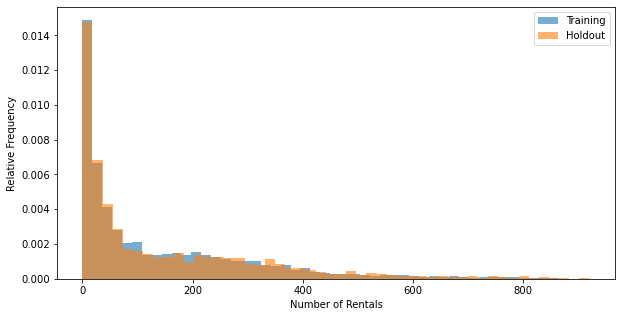

In [104]:
# Plot the distribution of the target variable in the training and holdout sets
plt.figure(figsize=(10, 5))
plt.hist(y_train, bins=50, alpha=0.6, label='Training', density= True)
plt.hist(y_test, bins=50, alpha=0.6, label='Holdout', density= True)
plt.xlabel('Number of Rentals')
plt.ylabel('Relative Frequency')
plt.legend()
plt.show()

___

### Model Building:

**1. Polynomial Regression**

Polynomial regression can model non-linear relationships between the independent and dependent variables, which allows for more flexibility in modeling complex data. This first model is using polynomial regression to predict the target variable bike rentals per hour, based on the previously selected input features. The input features are standardised, transformed to include polynomial interactions between them, and then passed through a Ridge regression model. Ridge regression includes a regularisation term to prevent overfitting. This term is controlled by a parameter called alpha, which determines the strength of the regularisation. The implemented GridSearchCV object returns the best combination of parameters for the polynomial degree and the alpha. 


The results indicate that the model performing best had a polynomial degree of 7 and a regularization strength of 44.0. The model with these parameters will be the one used for further prediction and evaulation.

In [105]:
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import Ridge

# Define the pipeline
pipe = Pipeline([('scaler', StandardScaler()), ('poly', PolynomialFeatures()), ('reg', Ridge())])

# Define the parameter grid
param_grid = {'poly__degree': range(1,10), 'reg__alpha': np.linspace(0, 100, num=101)}

# Create a GridSearchCV object
grid = GridSearchCV(pipe, param_grid, cv=5, scoring='neg_mean_squared_error')

# Fit the model to the training data
grid.fit(X_train, y_train)

# Print the best parameters
print("Best parameters: ", grid.best_params_)

Best parameters:  {'poly__degree': 7, 'reg__alpha': 44.0}


The code is using the trained model to make predictions on the test data set. Then, it calculates three evaluation metrics, namely Mean Absolute Error (MAE), Mean Squared Error (MSE), and R-squared, which are all commonly used to evaluate the performance of a regression model. The MAE is a measure of how far off the predictions are from the actual values, on average. The MSE is similar to MAE but it penalizes larger errors more heavily. R-squared is a measure of how well the model fits the data, with a value of 1 indicating a perfect fit and a value of 0 indicating that the model does not explain any of the variability in the data. 

The R-squared value of 0.721 tells us that the model explains 72.1% of the variance in the target variable. This means that the model is able to capture a majority of the underlying patterns in the data, but it is not optimal. There may be other factors that are not being considered by the model that are contributing to the remaining 27.9% of the variance in the target variable.

In [106]:
# Make predictions on the test data
y_pred = grid.predict(X_test)

# Calculate evaluation metrics
mae = mean_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Mean Absolute Error: ", mae)
print("Mean Squared Error: ", mse)
print("R-squared: ", r2)

Mean Absolute Error:  57.78078226709118
Mean Squared Error:  8364.196898082673
R-squared:  0.7209112191613285


This code is plotting a scatter plot of the actual target values against the predicted values for both the training and test data. The plot shows how well the model is performing in terms of predicting the target variable. The closer the points on the scatter plot are to the red line, which represents a perfect prediction, the better the model is performing. The two plots, one for the training data and one for the test data, allow to compare the model's performance on both sets of data. 

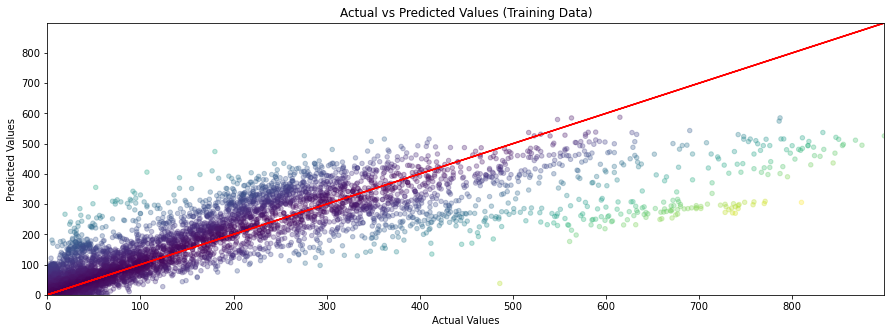

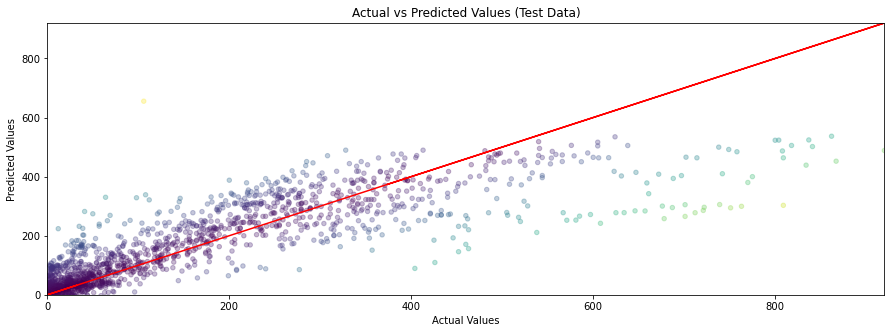

In [107]:
# Use the model to predict the target variable for the training data
predicted_values_train = grid.predict(X_train)

# Use the model to predict the target variable for the test data
predicted_values_test = grid.predict(X_test)

colors = np.abs(y_train - predicted_values_train) 

# Plot the actual target values against the predicted values for the training data
plt.scatter(y_train, predicted_values_train, c = colors, s=20, alpha=0.3)
plt.title("Actual vs Predicted Values (Training Data)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.plot(y_train, y_train, color = "red")
plt.axis([min(y_train), max(y_train), min(y_train), max(y_train)])
plt.show()

colors = np.abs(y_test - predicted_values_test)

# Plot the actual target values against the predicted values for the test data
plt.scatter(y_test, predicted_values_test, c = colors, s=20, alpha=0.3)
plt.title("Actual vs Predicted Values (Test Data)")
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.plot(y_test, y_test, color = "red")
plt.axis([min(y_test), max(y_test), min(y_test), max(y_test)]) 
plt.show()

The performance of the polynomial model we used was quite good for the start. However, it does have some disadvantages that we should keep in mind. One such disadvantage is that it can be prone to overfitting, where the model becomes too complex and starts fitting the noise in the data. Additionally, it can be sensitive to outliers in the data and can be computationally expensive as the degree of the polynomial increases. To further improve our predictions, we will continue with other models such as Random Forest, Neural Networks, and Gradient Boosting.

**2. Random Forest**

We build a random forest model as we expect it to be a suitable choice for bike sharing booking prediction based on time and weather data. The main reason is that RF models are able to handle high-dimensional and complex data, which is true for our use case as it is build on multiple features and contains trend and saisonality. RF models are also able to handle both categorical and numerical features, which is useful because of the time-based features in our dataset. Additionally, RF models are relatively robust to overfitting and missing data.

We start by creating a model and performing hyperparameter tuning.

In [108]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV

# Define the parameter grid for the Random Forest model
param_grid = {
    'n_estimators': [50, 100, 200, 500],
    'max_depth': [2, 5, 10, 20, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

# Create a Random Forest model
rf_model = RandomForestRegressor(random_state=42)

# Use RandomizedSearchCV to perform hyperparameter tuning
random_search = RandomizedSearchCV(estimator=rf_model, param_distributions=param_grid, n_iter=10, cv=5, n_jobs=-1, random_state=42)

# Fit the RandomizedSearchCV object to the training data
random_search.fit(X_train, y_train)

# Print the best parameters from the search
best_params = random_search.best_estimator_.get_params()
print("Best parameters found: ",best_params)

Best parameters found:  {'bootstrap': True, 'ccp_alpha': 0.0, 'criterion': 'squared_error', 'max_depth': None, 'max_features': 'sqrt', 'max_leaf_nodes': None, 'max_samples': None, 'min_impurity_decrease': 0.0, 'min_samples_leaf': 1, 'min_samples_split': 2, 'min_weight_fraction_leaf': 0.0, 'n_estimators': 100, 'n_jobs': None, 'oob_score': False, 'random_state': 42, 'verbose': 0, 'warm_start': False}


We use the identified optimal hyperparameters to create a new RF model, fit the model on our training set and make predictions on the holdout set.

In [109]:
# Use the best parameters to create a new model
best_rf_model = RandomForestRegressor(random_state=42, **random_search.best_params_)

# Fit the new model to the training data
best_rf_model.fit(X_train, y_train)

# Make predictions on the holdout set
y_pred = best_rf_model.predict(X_test)

# Evaluate the new model's performance on the holdout set
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Mean Squared Error: ", mse)
print("Mean Absolute Error: ", mae)
print("R-squared: ", r2)

Mean Squared Error:  2147.7500762154123
Mean Absolute Error:  26.23946473968073
R-squared:  0.9283358632489239


The metrics indicate that the random forest model is able to predict the number of bike rentals per hour with a relatively high level of accuracy. The Mean Squared Error (MSE) is a measure of how much the model's predictions deviate from the true values, with a lower value indicating a better fit. In this case, the MSE is 2147.75, which suggests that the model's predictions are relatively close to the true values.

The Mean Absolute Error (MAE) is similar to MSE, but it measures the average magnitude of the errors in the model's predictions, without considering their direction. The MAE in this case is 26.23, which suggests that the average magnitude of the errors is relatively low.

The R-squared value is a measure of how much of the variation in the output variable is explained by the model. A value of 1 indicates that the model explains all the variation, while a value of 0 means the model explains none of it. The R-squared value of 0.9283358632489239 indicates that the model explains a large proportion of the variation in the output variable, which is a good indication of model performance.

In summary, the results of the random forest model indicate that the model is able to predict the number of bike rentals per hour with a relatively high level of accuracy, and the MSE, MAE and R-squared values are all good indicators of the model's performance.

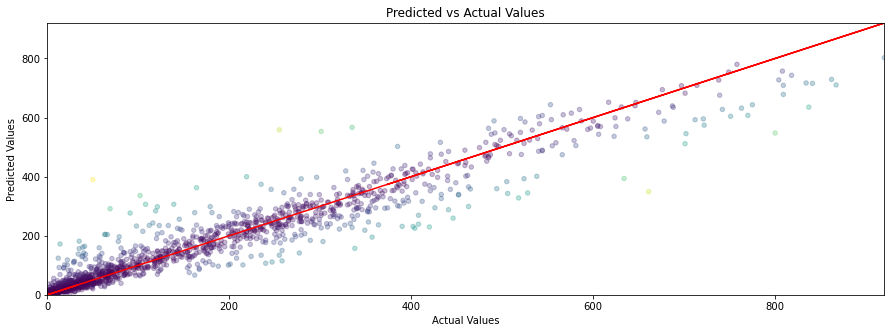

In [110]:
# Create an array of colors based on the difference between the predicted and actual values
colors = np.abs(y_test - y_pred)

# Plot the predicted vs actual values on the holdout set
plt.scatter(y_test, y_pred, c=colors, s=20, alpha=0.3)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Predicted vs Actual Values")
plt.plot(y_test, y_test, color = "red")
plt.axis([min(y_test), max(y_test), min(y_test), max(y_test)]) 
plt.show()

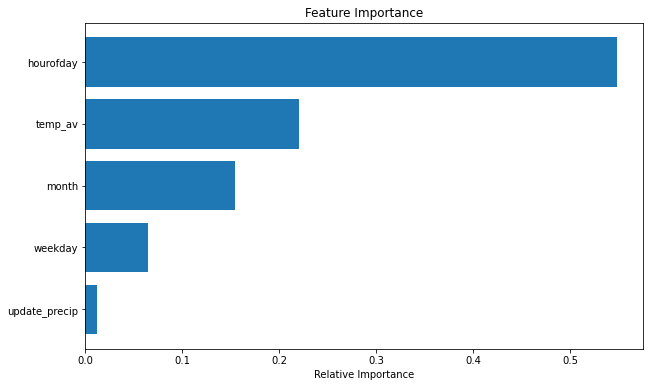

In [111]:
# Plot the distribution of the feature importances
importances = best_rf_model.feature_importances_
features = X_train.columns
indices = np.argsort(importances)
plt.figure(figsize=(10,6))
plt.barh(range(len(indices)), importances[indices], align='center')
plt.yticks(range(len(indices)), [features[i] for i in indices])
plt.xlabel('Relative Importance')
plt.title('Feature Importance')
plt.show()

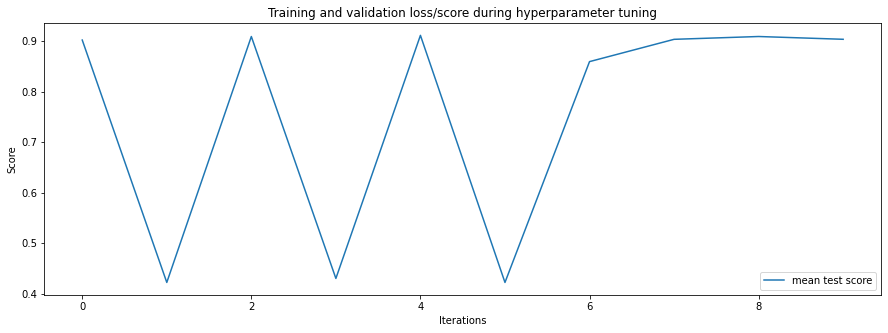

In [112]:
# plot the training and validation loss/score during hyperparameter tuning
plt.plot(random_search.cv_results_['mean_test_score'], label = 'mean test score')
plt.xlabel('Iterations')
plt.ylabel('Score')
plt.title('Training and validation loss/score during hyperparameter tuning')
plt.legend()
plt.show()

**3. Neural Network**

We expect that neural networks might be equally suitable for our use case, because they as well can deal with complex data. Neural networks are also able to learn non-linear relationships between the features and the target variable, which can be useful when working with time series data. Additionally, neural networks are able to handle both categorical and numerical features.

In [113]:
from sklearn.preprocessing import StandardScaler

# Create a StandardScaler object
scaler = StandardScaler()

# Fit the StandardScaler to the training data
scaler.fit(X_train)

# Scale the training data
X_train_scaled = scaler.transform(X_train)

# Scale the test data using the same scaler
X_test_scaled = scaler.transform(X_test)

# Define the parameter grid for the MLP model
param_grid = {
    'hidden_layer_sizes': [(10,), (20,), (30,), (40,)],
    'activation': ['identity', 'logistic', 'tanh', 'relu'],
    'solver': ['lbfgs', 'sgd', 'adam'],
    'alpha': [0.0001, 0.001, 0.01, 0.1],
    'learning_rate': ['constant', 'invscaling', 'adaptive'],
    'max_iter': [200, 500, 1000]
}

# Create an MLP model
mlp_model = MLPRegressor(random_state=42)

# Use RandomizedSearchCV to perform hyperparameter tuning
random_search = RandomizedSearchCV(estimator=mlp_model, param_distributions=param_grid, n_iter=10, cv=5, n_jobs=-1, random_state=42)

# Fit the RandomizedSearchCV object to the scaled training data
random_search.fit(X_train_scaled, y_train)

# Print the best parameters from the search
best_params = random_search.best_estimator_.get_params()
print("Best parameters found: ",best_params)

# Use the best parameters to create a new model
best_mlp_model = MLPRegressor(random_state=42, **random_search.best_params_)

# Fit the new model to the scaled training data
best_mlp_model.fit(X_train_scaled, y_train)

# Make predictions on the scaled holdout set
y_pred = best_mlp_model.predict(X_test_scaled)

# Evaluate the new model's performance on the holdout set
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
print("Mean Squared Error: ", mse)
print("Mean Absolute Error: ", mae)
print("R-squared: ", r2)


NameError: name 'MLPRegressor' is not defined

This model performs sufficiently well on our dataset. Scaling the data before training the model seems to increase the model´s performance, possibly because it avoids the domination of singular features during the optimization process.

In [ ]:
# Plot the predicted vs actual values on the test set
plt.scatter(y_test, y_pred, c=colors, s=20, alpha=0.3)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Predicted vs Actual Values")
plt.plot(y_test, y_test, color = "red")
plt.axis([min(y_test), max(y_test), min(y_test), max(y_test)]) 
plt.show()

In [ ]:
# Plot the distribution of residuals (predicted - actual)
residuals = y_pred - y_test
plt.hist(residuals, bins=20)
plt.xlabel("Residuals")
plt.ylabel("Frequency")
plt.title("Distribution of Residuals")
plt.show()

**4. Gradient Boosting**

Gradient Boosting is useful for combining different models because it can help to reduce the bias and variance of the individual models. By training weak models and combining them in an ensemble, Gradient Boosting can help to reduce the overfitting of the individual models. Also, It can help to improve the overall performance of the model by combining the strengths of the different models.

For the task at hand, where the goal is to predict bike sharing booking, Gradient Boosting might be useful because it can take advantage of the strengths of our different models. For example, polynomial regression may be good at modeling linear relationships, random forest may be good at handling high-dimensional and complex data, and neural network may be good at handling non-linear relationships. By combining these models in an ensemble, Gradient Boosting we expect Gradient Boosting to help to improve the overall performance of the model by combining the strengths of the different models.

In [ ]:
from sklearn.ensemble import GradientBoostingRegressor

# Create a Gradient Boosting model
gb_model = GradientBoostingRegressor(random_state=42)

# Train the model using the poynomial regression, random forest and neural network predictions as input features
X_train_gb = np.column_stack((grid.predict(X_train), best_rf_model.predict(X_train), best_mlp_model.predict(X_train)))
X_test_gb = np.column_stack((grid.predict(X_test), best_rf_model.predict(X_test), best_mlp_model.predict(X_test)))

gb_model.fit(X_train_gb, y_train)

# Make predictions on the test set
y_pred = gb_model.predict(X_test_gb)

# Evaluate the model performance
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Squared Error: ", mse)
print("Mean Absolute Error: ", mae)
print("R-squared: ", r2)

Leveragin gradient boosting to combine our previous models does provide good performance, though it is very close to the results of the RF model and even slightly worse. It seems therefore that the orignal RF model is quite suitable for the given task and the structure of our dataset.

In [ ]:
# Calculate the residuals
residuals = y_test - y_pred
# Create a scatter plot of the residuals
plt.hist(residuals, bins=20)
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.show()

In [ ]:
# Plot the predicted vs actual values on the test set
plt.scatter(y_test, y_pred, c=colors, s=20, alpha=0.3)
plt.xlabel("Actual Values")
plt.ylabel("Predicted Values")
plt.title("Predicted vs Actual Values")
plt.plot(y_test, y_test, color = "red")
plt.axis([min(y_test), max(y_test), min(y_test), max(y_test)]) 
plt.show()

In [ ]:
# Create a learning curve
train_sizes, train_scores, test_scores = learning_curve(gb_model, X_train_gb, y_train, cv=5)
# Plot the learning curve
plt.plot(train_sizes, np.mean(train_scores, axis=1), label='Training Score')
plt.fill_between(train_sizes, np.mean(train_scores, axis=1) - np.std(train_scores, axis=1),
np.mean(train_scores, axis=1) + np.std(train_scores, axis=1), color='gray', alpha=0.2)
plt.plot(train_sizes, np.mean(test_scores, axis=1), label='Testing Score')
plt.fill_between(train_sizes, np.mean(test_scores, axis=1) - np.std(test_scores, axis=1),
np.mean(test_scores, axis=1) + np.std(test_scores, axis=1), color='gray', alpha=0.2)
plt.xlabel('Number of Training Samples')
plt.ylabel('Score')
plt.legend()
plt.show()

___